# Analysis of benchmark times

In this notebook, we'll load some data about DaCapo benchmarks. The data contains running times for different "variants" of the benchmarks, and information about the context in which the benchmark is run (machine, startup / steady state, etc). We'll analyse this data to see if context influences the effect of the changes we've made to variants.

In [96]:
benchmark = "chart"

"chart"

In [97]:
using CSV, DataFrames, Plots, StatsPlots

In [98]:
data = CSV.read("data/$benchmark-data-multimachine.csv", DataFrame);

In [99]:
names(data)

20-element Vector{String}:
 "Column1"
 "warmup"
 "running-time"
 "jvm-invocation"
 "benchmark"
 "variant"
 "java-version"
 "cpu-model"
 "kernel-release"
 "hostname"
 "kernel-version"
 "cache-properties"
 "converged"
 "run-number"
 "modified_sites_id"
 "label"
 "variant-type"
 "original"
 "first-run"
 "status"

In [100]:
unique(data[!, "java-version"])

3-element Vector{String}:
 "openjdk version \"11.0.12\" 2021-07-20"
 "openjdk version \"1.8.0_292\""
 "8.0.292-open"

In [101]:
selected_columns = ["status", "hostname", "running-time",
    "converged", "first-run", "variant-type",
    "jvm-invocation", "benchmark", "label"] |> x -> map(Symbol, x)

9-element Vector{Symbol}:
 :status
 :hostname
 Symbol("running-time")
 :converged
 Symbol("first-run")
 Symbol("variant-type")
 Symbol("jvm-invocation")
 :benchmark
 :label

In [102]:
data = data[!, selected_columns]

,status,hostname,running-time,converged,first-run,variant-type,jvm-invocation
,String15,String15,Int64,Bool,Bool,String31,Int64
1,Startup,exjobb7,2611,0,1,best,0
2,Warmup,exjobb7,1594,0,0,best,0
3,Warmup,exjobb7,1596,0,0,best,0
4,Warmup,exjobb7,1559,0,0,best,0
5,Steady-state,exjobb7,1607,1,0,best,0
6,Startup,exjobb7,2614,0,1,best,1
7,Warmup,exjobb7,1645,0,0,best,1
8,Warmup,exjobb7,1561,0,0,best,1
9,Warmup,exjobb7,1551,0,0,best,1


In [103]:
# We rename the levels of the variables
machine_rename = Dict("exjobb7" => "m1", "sde-pascal" => "m2","algol" => "m3")

data[!,:machine] = map(x -> machine_rename[x], data[!, :hostname]);

In [116]:
data[!,:treatment] = data[!,:label]

7143-element PooledArrays.PooledVector{String31, UInt32, Vector{UInt32}}:
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 "expected-best-steady-state"
 ⋮
 "0->hasharraylist"
 "0->hasharraylist"
 "0->hasharraylist"
 "0->hasharraylist"
 "0->hasharraylist"
 "0->hasharraylist"
 "0->hasharraylist"
 "0->hasharraylist"
 "0->hasharraylist"
 "0->hasharraylist"
 "0->hasharraylist"
 "0->hasharraylist"

In [117]:
# These are specific to bloat
# selected_variants = ["0->hasharraylist", "1->arraymap", "original"]

In [118]:
# We remove the rows which aren't startup of converged runs
# It's a bit imporant to remove samples, because the sampling grows quite a lot with the number of samples
selected = filter(r -> r[:converged] || r[Symbol("first-run")], data) |>
    x -> filter(r -> r[Symbol("variant-type")] ∈ ["original", "ortho"], x)

,status,hostname,running-time,converged,first-run,variant-type,jvm-invocation
,String15,String15,Int64,Bool,Bool,String31,Int64
1,Startup,exjobb7,2625,0,1,ortho,0
2,Steady-state,exjobb7,1559,1,0,ortho,0
3,Startup,exjobb7,2632,0,1,ortho,1
4,Steady-state,exjobb7,1558,1,0,ortho,1
5,Startup,exjobb7,2632,0,1,ortho,2
6,Steady-state,exjobb7,1561,1,0,ortho,2
7,Startup,exjobb7,2598,0,1,ortho,3
8,Steady-state,exjobb7,1566,1,0,ortho,3
9,Startup,exjobb7,2621,0,1,ortho,4


# Data processing

We prepare the data for using with Turing. the model only accepts arrays of numbers, and we need to get the standardized log running time.

In [119]:
n_samples = nrow(selected)

2520

In [120]:
unique(selected[!, :treatment])

21-element Vector{String31}:
 "6->hashmap"
 "8->hashmap"
 "original"
 "9->linkedlist"
 "9->hasharraylist"
 "8->arraymap"
 "7->linkedlist"
 "7->hasharraylist"
 "6->arraymap"
 "5->linkedlist"
 "5->hasharraylist"
 "4->linkedlist"
 "4->hasharraylist"
 "3->linkedlist"
 "3->hasharraylist"
 "2->linkedlist"
 "2->hasharraylist"
 "1->linkedlist"
 "1->hasharraylist"
 "0->linkedlist"
 "0->hasharraylist"

In [121]:
using Statistics

In [122]:
# We make a small struct to go back and forth between standardized and normal values
# Not used?
struct Standardizer
    from_std
    to_std
end

function standardizer(values)
    mu = mean(values)

    sigma = std(values)

    to_std(xs) = (xs .- mu) ./ sigma

    from_std(xs) = xs .* sigma .+ mu

    return Standardizer(from_std, to_std)
end


standardizer (generic function with 1 method)

In [123]:
using VegaLite

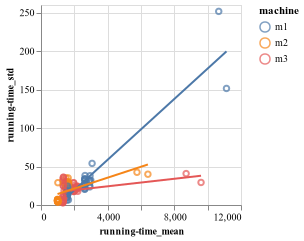

In [124]:
groupby(selected, [:status, :machine, :treatment]) |>
gs -> combine(gs, Symbol("running-time") => mean, 
                  Symbol("running-time") => std) |>
@vlplot(
    layer=[
        {mark=:point, x=Symbol("running-time_mean"), y=Symbol("running-time_std"), color=:machine},
        {mark=:line,
         transform=[{regression=Symbol("running-time_std"),
                     on=Symbol("running-time_mean"),
                     groupby=[:machine]}],
         y=Symbol("running-time_std"), x=Symbol("running-time_mean"), color=:machine}
        ],
    config={font="Times New Roman", axis={titleFontSize="10"}})

Seems like variance increases with running time, except for algol.

In [125]:
groupby(selected, [:machine]) |> gs -> combine(gs, Symbol("running-time")=>mean)

,machine,running-time_mean
,String,Float64
1,m1,2584.32
2,m3,2047.0
3,m2,1504.06


Interesting fact, the difference between fastest and slowest machine is ~2x for bloat, but it's ~5x for avrora!

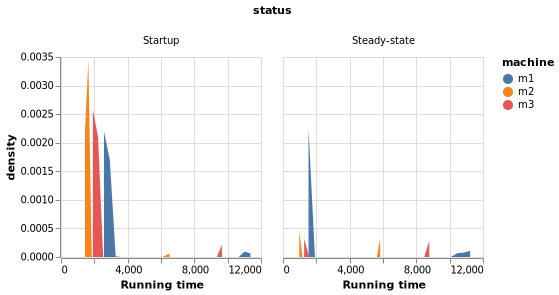

In [126]:
selected |>
@vlplot(
    column=:status,
    transform=[{density=Symbol("running-time"), groupby=[:status, :machine]}],
    mark=:area,
    x={field="value", type="quantitative", title="Running time"},
    y={field="density", type="quantitative"},
    color=:machine
)

We will use regression against the log of the running times, for three reasons:

1. Running time is always positive
2. The variance seems to increase with the running time
3. The distributions are skewed to the left (long-ish tail)

In [127]:
# We transform columns into arrays of indices
benchmarks = unique(selected[!, :benchmark]);
machines = unique(selected[!, :machine]);
treatments = unique(selected[!, :treatment]);
warmups = ["Startup", "Steady-state"]

selected[!, :warmup_ids] = indexin(selected[!, :status], warmups);
selected[!, :machine_ids] = indexin(selected[!, :machine], machines);
selected[!, :treatment_ids] = indexin(selected[!, :treatment], treatments);

In [128]:
# Now we process the running times
running_time_log = map(log, selected[!, Symbol("running-time")])

running_time_log_centered = running_time_log .- mean(running_time_log)

2520-element Vector{Float64}:
  0.40180206088100245
 -0.11923424508694502
  0.40446517830048645
 -0.11987588771402802
  0.40446517830048645
 -0.11795219362928933
  0.39146308308582345
 -0.11475423759397341
  0.4002770891786849
 -0.1128403614116893
  0.3941538400427458
 -0.12631505999504888
  0.38953667139394277
  ⋮
 -0.05766677844948109
 -0.5493759299935927
 -0.049258320500074504
 -0.55233889512425
 -0.02153610876187262
 -0.55233889512425
 -0.08332487506368125
 -0.5533285043094169
 -0.06008223856108508
 -0.5543190937911131
 -0.0462723523215125
 -0.5503626098960384

In [129]:
selected[!, :log_running_time] = running_time_log
selected[!, :centered_log_running_time] = running_time_log_centered

2520-element Vector{Float64}:
  0.40180206088100245
 -0.11923424508694502
  0.40446517830048645
 -0.11987588771402802
  0.40446517830048645
 -0.11795219362928933
  0.39146308308582345
 -0.11475423759397341
  0.4002770891786849
 -0.1128403614116893
  0.3941538400427458
 -0.12631505999504888
  0.38953667139394277
  ⋮
 -0.05766677844948109
 -0.5493759299935927
 -0.049258320500074504
 -0.55233889512425
 -0.02153610876187262
 -0.55233889512425
 -0.08332487506368125
 -0.5533285043094169
 -0.06008223856108508
 -0.5543190937911131
 -0.0462723523215125
 -0.5503626098960384

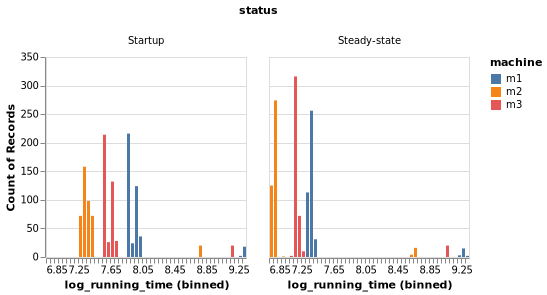

In [130]:
selected |>
@vlplot(
    column=:status,
    mark=:bar,
    x={field=:log_running_time, bin={step=0.05}},
    y="count()",
    color=:machine
)

# Statistical Models

To analyse the effect of each treatment (that is, how fast each variant runs compared to the original), we will use: 

1. A frequentist model
2. A no-pooling linear model
3. two hierarchical linear models. 

The hierarchical models are:

1. A model where the treatment effect doesn't vary with the context
2. A model where there is an interaction between context and treatment effect

## Training and test set

We'll split the data into training and test set.

In [131]:
selected[!,:running_time] = selected[!, Symbol("running-time")];

In [132]:
limit = 10

10

In [133]:
training = filter(r -> r[Symbol("jvm-invocation")] < limit, selected);

In [134]:
test = filter(r -> r[Symbol("jvm-invocation")] >= limit, selected);

In [135]:
nrow(training)

1260

## Model 1.1: No interactions, Frequentist model

In [136]:
using GLM

In [137]:
contrasts = Dict(:label => StatsModels.DummyCoding(base="original"),
                 :machine => StatsModels.FullDummyCoding(),
                 :status => StatsModels.FullDummyCoding())

Dict{Symbol, AbstractContrasts} with 3 entries:
  :status  => FullDummyCoding()
  :label   => DummyCoding("original", nothing)
  :machine => FullDummyCoding()

In [138]:
@time(
freq_model = lm(@formula(centered_log_running_time ~ machine + status + treatment),
    training,
    contrasts = contrasts)
)

  1.701138 seconds (2.25 M allocations: 135.575 MiB, 1.38% gc time, 99.37% compilation time)


StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

centered_log_running_time ~ 1 + machine + status + treatment

Coefficients:
─────────────────────────────────────────────────────────────────────────────────────────────────────
                                   Coef.    Std. Error        t  Pr(>|t|)    Lower 95%      Upper 95%
─────────────────────────────────────────────────────────────────────────────────────────────────────
(Intercept)                  -0.00513819    0.00813735    -0.63    0.5279   -0.0211027    0.0108264
machine: m1                   0.0         NaN            NaN       NaN     NaN          NaN
machine: m2                  -0.519196      0.00406868  -127.61    <1e-99   -0.527178    -0.511214
machine: m3                  -0.229184      0.00406868   -56.33    <1e-99   -0.237166    -0.221201
status: Startup               0.458285      0.0033

In [139]:
# With this you can show how the regression model encodes categorical variables.
StatsModels.modelmatrix(freq_model)

1260×26 Matrix{Float64}:
 1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0

In [140]:
function R2(model, X::DataFrame, y::Vector{T}) where {T}
    predictions = predict(model, X)
    
    tss = y .- mean(y) |> x -> x.^2 |> sum
    ess = y .- predictions |> x -> x.^2 |> sum
    
    return 1 - ess / tss
end

R2 (generic function with 1 method)

In [141]:
R2(freq_model, 
   test[!, [:machine, :status, :treatment]],
   test[!, :centered_log_running_time]) |> x -> round(x, digits=3)

0.985

The frequentist model gets **98% accuracy on the test set**.

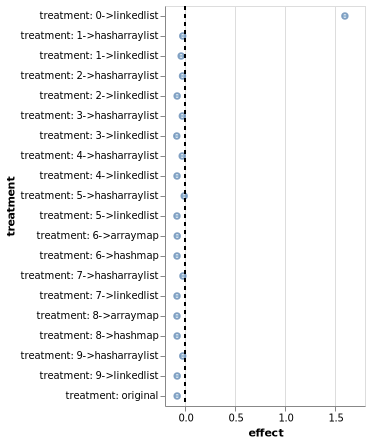

In [142]:
p_freq_0 = DataFrame(:coefficient => coefnames(freq_model),
    :coef => coef(freq_model),
    :stderr => stderror(freq_model),
    :coef_min => confint(freq_model)[:,1],
    :coef_max => confint(freq_model)[:,2]) |>
    df -> filter(r -> occursin("treatment", r[:coefficient]), df) |>
    @vlplot(
    y={field=:coefficient, title="treatment"},
    width=200,
    layer=[
        {mark=:point, x={field=:coef, scale={zero=false}, title="effect"}},
        {mark={:rule, color="steelblue"}, x=:coef_min, x2=:coef_max},
        {mark={type=:rule, strokeDash=[4,4]}, x={datum=0.0}, y={value=0.0}, y2={value="height"}}
    ]
)

In [81]:
save("figures/plot_effects_no_interaction_freq_$benchmark.svg", p_freq_0)

This plot looks exactly like the plot you obtain from the bayesian model (no interactions)

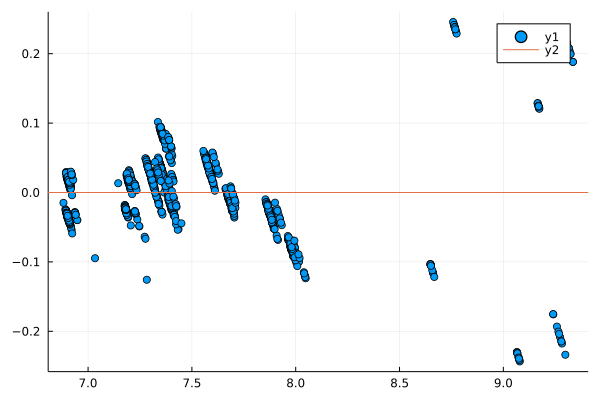

In [143]:
# Residuals
residuals_test = predict(freq_model, test[!, [:machine,:treatment,:status]]) .- test[!, :centered_log_running_time]

scatter(test[!, :log_running_time], residuals_test)
    
hline!([0.0])

In [144]:
fit(Normal, residuals_test)

Normal{Float64}(μ=-0.00013921247037734238, σ=0.05783155413328895)

In [145]:
using Distributions

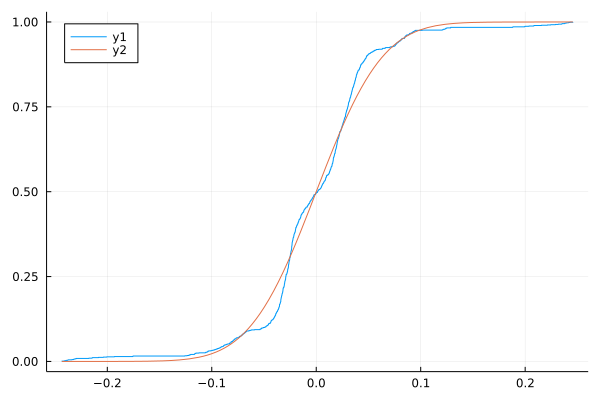

In [146]:
ecdfplot(residuals_test)
plot!(x -> cdf(Normal(0.0, 0.05), x))

Seems like we can safely assume that noise is normally distributed.

# Model 1.2: Frequentist model with interactions

In [147]:
# Let's try with interactions.
@time(
freq_model_interactions = lm(
    @formula(centered_log_running_time ~ 1 + machine + status + (treatment & (status + machine))),
    training,
    contrasts = contrasts
)
)

  0.929017 seconds (1.44 M allocations: 94.943 MiB, 2.76% gc time, 98.64% compilation time)


StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

centered_log_running_time ~ 1 + machine + status + treatment & status + treatment & machine

Coefficients:
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
                                                          Coef.    Std. Error       t  Pr(>|t|)      Lower 95%     Upper 95%
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
(Intercept)                                         -0.0222488     0.00844506   -2.63    0.0085   -0.0388179     -0.00567978
machine: m1                                          0.0         NaN           NaN       NaN     NaN            NaN
machine: m2                                         -0.550077      0.010343    -53.18    <1e-99   -

In [148]:
r2(freq_model_interactions)

0.9955760652572855

In [149]:
R2(freq_model_interactions,
    test[!, [:machine, :status, :treatment]],
    test[!, :centered_log_running_time]) |> x -> round(x, digits=3)

0.995

The frequentist model with interactions has an **accuracy of 99%**. 

In [150]:
function parse_coef_label(label)
    kvps = split(label, "&") |> words -> map(x -> strip(x), words)
    
    pairs = []
    
    for kvp in kvps
        splitted = split(kvp, ":")
        k = strip(splitted[1])
        v = strip(splitted[2])
        append!(pairs, [(k => v)])
    end
    
    return Dict(pairs)
end

parse_coef_label (generic function with 1 method)

In [151]:
function DataFrame(lin_model::StatsModels.TableRegressionModel)
    records = []
    
    for i in 1:length(coefnames(lin_model))
        name = coefnames(lin_model)[i]
        if name == "(Intercept)"
            continue 
        end
        interaction_info = parse_coef_label(name)
        
        value = coef(lin_model)[i]
        value_intervals = confint(lin_model)[i,:]
        
        record = (treatment=get(interaction_info,"treatment", missing),
            machine=get(interaction_info, "machine", missing),
            status=get(interaction_info, "status", missing),
            value=value,
            min=value_intervals[1],
            max=value_intervals[2])
        
        append!(records, [record])
    end
    return DataFrame(records)
end

DataFrame

In [152]:
model_df = DataFrame(freq_model_interactions)

,treatment,machine,status,value,min,max
,SubStrin…?,SubStrin…?,SubStrin…?,Float64,Float64,Float64
1,missing,m1,missing,0.0,NaN,NaN
2,missing,m2,missing,-0.550077,-0.57037,-0.529784
3,missing,m3,missing,-0.244134,-0.264427,-0.223841
4,missing,missing,Startup,0.523061,0.506491,0.53963
5,missing,missing,Steady-state,0.0,NaN,NaN
6,0->linkedlist,missing,Startup,1.36649,1.34305,1.38992
7,1->hasharraylist,missing,Startup,-0.0303736,-0.0538058,-0.00694141
8,1->linkedlist,missing,Startup,-0.0926733,-0.116106,-0.0692411
9,2->hasharraylist,missing,Startup,-0.0335297,-0.0569619,-0.0100975


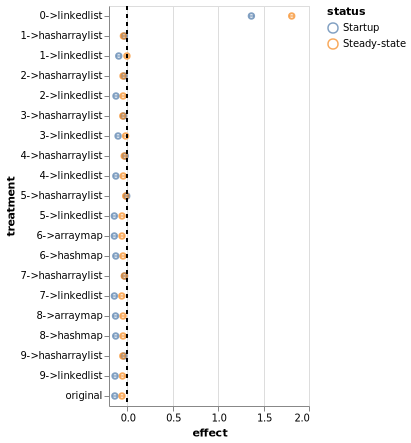

In [153]:
model_df |>
    df -> filter(r -> !ismissing(r[:treatment]), df) |>
    df -> filter(r -> !ismissing(r[:status]), df) |>
    @vlplot(
    y=:treatment,
    x={field=:value, title="effect", zero=false},
    layer=[
        {mark=:point, x={field=:value, scale={zero=false}}, y=:treatment, color=:status},
        {mark=:rule, x=:min, x2=:max, y=:treatment, color=:status},
        {mark={type=:rule, strokeDash=[4,4]}, x={datum=0.0}, y={value=0.0}, y2={value="height"}}
    ]
)

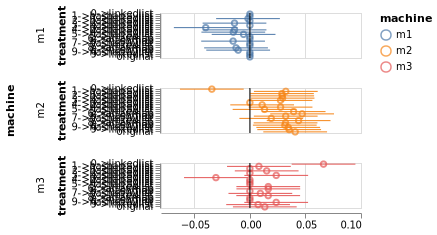

In [154]:
p_freq_interactions = model_df |>
    df -> filter(r -> !ismissing(r[:treatment]), df) |>
    df -> filter(r -> !ismissing(r[:machine]), df) |>
    @vlplot(
    facet={row={field=:machine}},
    spec={layer=[
        {mark=:point, x={field=:value, scale={zero=false}}, y=:treatment, color=:machine},
        {mark=:rule, x=:min, x2=:max, y=:treatment, color=:machine},
        {mark=:rule, x=[0.0]},
        ],
        height=45
    },
)

In [155]:
save("figures/plot_effect_machine_treatment_freq_$benchmark.svg",p_freq_interactions)

In [156]:
ftest(freq_model.model, freq_model_interactions.model)

F-test: 2 models fitted on 1260 observations
────────────────────────────────────────────────────────────────
     DOF  ΔDOF     SSR     ΔSSR      R²     ΔR²       F*   p(>F)
────────────────────────────────────────────────────────────────
[1]   25        4.2968           0.9849                         
[2]   85    60  1.2581  -3.0387  0.9956  0.0107  47.3415  <1e-99
────────────────────────────────────────────────────────────────

We can see:

- the second model gets fits the data a bit better.
- t2 is slightly faster on m3 than on m1, m2
- t2 is much faster in steady state

## Summary of Frequentist regression

These plots are similar to what we will obtain with the Bayesian model, except in the Frequentist case, I get the interaction of treatment and machine relative to `sde-pascal` (I don't know why). Apart from that, the coefficients (and the error) we get are similar to what we will obtain through the Bayesian model.

The frequentist models are *very* accurate already, with only three jvm iterations.

# Bayesian Models

## Model 2.1: Context does not matter

We assume that the machine used and the warmup effect have an effect on the runtime, but the effect of a treatment (collection change) is the same regardless.

## Machines
We set a prior on the effect of the machine, compared to the mean. The effect is normally distributed with mean 0.0 and $\sigma$ inferred from the data. There is one independent effect for each machine, but the standard deviation is pooled across machines.

$$
\sigma_{machines} \sim \text{Exponential}(0.5)\\
\alpha_{m} \sim \text{Normal}(0.0, \sigma_{machines})
$$

## Warmup
We set a similar prior for the effect of warmup: Normally distributed, with a $\sigma$ that is learned from the data. There are two warmup states, so two priors.

$$
\sigma_{warmups} \sim \text{Exponential}(0.5)\\
\beta_{startup} \sim \text{Normal}(0.0, \sigma_{warmups})\\
\beta_{steady} \sim \text{Normal}(0.0, \sigma_{warmups})
$$

## Treatments
Similarly, for each treatment, we set a Normal prior for its effect, but the $\sigma$ of the distribution is learned from the data. Instead of using an exponential prior, we use a truncated Normal. The reason for this is that the thinner tail of the normal helps with sampling. 

$$
\sigma_{treatments} \sim \text{Exponential}(0.1)\\
\gamma_{t} \sim \text{Normal}(0.0, \sigma_{treatments})\\
$$


## Likelihood
We consider the log running time of the program is the sum of these effects plus some gaussian noise.

$$
\mu_j = \alpha_{M[j]} + \beta_{W[j]} + \gamma_{T[j]}\\
\sigma \sim \text{Exponential(0.1)}\\
\log(\text{running_time}_j) \sim \text{Normal}(\mu_j, \sigma)\\
$$

In [157]:
using Turing, FillArrays, Distributions, LinearAlgebra

In [158]:
@model function treatment_model_no_context(
        nmachines,
        ntreatments,
        machine_idxs, warmup_idxs, treatment_idxs,
        running_time_obs_std, ::Type{T}=Float64) where T
    
    # We assume the mean running time is zero
    # (I think I have enough data-points to assume
    # there's little uncertainty about that, and centering is enough)

    # Effect of the machine
    sigma_machines ~ Exponential(0.4)
    effect_machine ~ MvNormal(Fill(0.0, nmachines), sigma_machines)

    # Effect of the warmup
    sigma_warmup ~ Exponential(0.4)
    effect_warmup ~ MvNormal(Fill(0.0, 2), sigma_warmup)
    
    # Effect of treatment
    sigma_treatments ~ Exponential(0.1)
    effect_treatment ~ MvNormal(Fill(0.0, ntreatments), sigma_treatments)

    sigma ~ Exponential(0.1)

    N = length(running_time_obs_std)
    running_time = Vector{T}(undef, N)
    for i in 1:N
        machine_i = machine_idxs[i]
        warmup_i = warmup_idxs[i]
        treatment_i = treatment_idxs[i]

        effects_jvm = effect_machine[machine_i] + effect_warmup[warmup_i]

        # 0.0 is the average time
        running_time[i] = effects_jvm + effect_treatment[treatment_i]

        running_time_obs_std[i] ~ Normal(running_time[i], sigma)
    end
    
    # Useful for the Bayesian R2
    line_variance = var(running_time)
    residuals_variance = sigma*sigma
    R2 = line_variance / (line_variance + residuals_variance)
   
    return (finite_sd_machine=std(effect_machine),
            finite_sd_warmup=std(effect_warmup),
            finite_sd_treatments=std(effect_treatment),
            finite_sd_residuals=std(running_time .- running_time_obs_std),
            r2=R2)
end

treatment_model_no_context (generic function with 3 methods)

# Inference

In [159]:
model_h0 = treatment_model_no_context(length(machines),
                                      length(treatments),
                                      training[!, :machine_ids], 
                                      training[!, :warmup_ids],
                                      training[!, :treatment_ids],
                                      training[!, :centered_log_running_time])

DynamicPPL.Model{typeof(treatment_model_no_context), (:nmachines, :ntreatments, :machine_idxs, :warmup_idxs, :treatment_idxs, :running_time_obs_std, Symbol("##arg#289")), (Symbol("##arg#289"),), (), Tuple{Int64, Int64, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Float64}, DataType}, Tuple{DataType}, DynamicPPL.DefaultContext}(treatment_model_no_context, (nmachines = 3, ntreatments = 21, machine_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], warmup_idxs = Union{Nothing, Int64}[1, 2, 1, 2, 1, 2, 1, 2, 1, 2  …  1, 2, 1, 2, 1, 2, 1, 2, 1, 2], treatment_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  21, 21, 21, 21, 21, 21, 21, 21, 21, 21], running_time_obs_std = [0.40180206088100245, -0.11923424508694502, 0.40446517830048645, -0.11987588771402802, 0.40446517830048645, -0.11795219362928933, 0.39146308308582345, -0.11475423759397341, 0.4002770891786849, -0.1128403614116893  …  

In [160]:
function sample_model(model::DynamicPPL.Model)
    # These lines made the model go from 10 minutes / chain to 1 minute / chain (!)
    # Source: https://discourse.julialang.org/t/multi-level-varying-slopes-with-two-clusters-cross-classification/62036/6?u=neal
    # Turing.setadbackend(:reversediff)
    # Turing.setrdcache(true)

    nuts_sampler = NUTS(0.7)

    chain = sample(model, nuts_sampler, MCMCSerial(), 1000, 4)

    return chain
end

sample_model (generic function with 1 method)

In [161]:
@time(
chain_h0 = sample_model(model_h0)
)

┌ Info: Found initial step size
│   ϵ = 0.025
└ @ Turing.Inference /home/noric/.julia/packages/Turing/Tpj0b/src/inference/hmc.jl:188
Sampling (Chain 1 of 4): 100%|██████████████████████████| Time: 0:02:11
┌ Info: Found initial step size
│   ϵ = 0.0125
└ @ Turing.Inference /home/noric/.julia/packages/Turing/Tpj0b/src/inference/hmc.jl:188
Sampling (Chain 2 of 4): 100%|██████████████████████████| Time: 0:03:18
┌ Info: Found initial step size
│   ϵ = 0.0125
└ @ Turing.Inference /home/noric/.julia/packages/Turing/Tpj0b/src/inference/hmc.jl:188
Sampling (Chain 3 of 4): 100%|██████████████████████████| Time: 0:01:47
┌ Info: Found initial step size
│   ϵ = 0.025
└ @ Turing.Inference /home/noric/.julia/packages/Turing/Tpj0b/src/inference/hmc.jl:188
Sampling (Chain 4 of 4): 100%|██████████████████████████| Time: 0:02:47


643.423157 seconds (262.65 M allocations: 872.669 GiB, 6.00% gc time, 0.08% compilation time)


Chains MCMC chain (1000×42×4 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 4
Samples per chain = 1000
Wall duration     = 628.97 seconds
Compute duration  = 625.61 seconds
parameters        = sigma_machines, effect_machine[1], effect_machine[2], effect_machine[3], sigma_warmup, effect_warmup[1], effect_warmup[2], sigma_treatments, effect_treatment[1], effect_treatment[2], effect_treatment[3], effect_treatment[4], effect_treatment[5], effect_treatment[6], effect_treatment[7], effect_treatment[8], effect_treatment[9], effect_treatment[10], effect_treatment[11], effect_treatment[12], effect_treatment[13], effect_treatment[14], effect_treatment[15], effect_treatment[16], effect_treatment[17], effect_treatment[18], effect_treatment[19], effect_treatment[20], effect_treatment[21], sigma
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, ste

In [163]:
ess_rhat(chain_h0)

ESS
            parameters         ess      rhat   ess_per_sec 
                Symbol     Float64   Float64       Float64 

        sigma_machines   1127.9627    1.0003        1.8030
     effect_machine[1]    604.2099    1.0033        0.9658
     effect_machine[2]    605.2048    1.0033        0.9674
     effect_machine[3]    603.6523    1.0033        0.9649
          sigma_warmup   1052.8766    1.0008        1.6830
      effect_warmup[1]    603.4870    1.0013        0.9646
      effect_warmup[2]    601.8793    1.0013        0.9621
      sigma_treatments   1093.5385    1.0027        1.7480
   effect_treatment[1]    237.2588    1.0166        0.3792
   effect_treatment[2]    239.3533    1.0168        0.3826
   effect_treatment[3]    236.6123    1.0166        0.3782
   effect_treatment[4]    239.6060    1.0168        0.3830
   effect_treatment[5]    239.1404    1.0167        0.3823
   effect_treatment[6]    236.1292    1.0172        0.3774
   effect_treatment[7]    239.4435    1.0166     

In [164]:
plot(chain_h0)

In [165]:
fit(LogNormal,chain_h0[:sigma_machines])

LogNormal{Float64}(μ=-1.240421545788439, σ=0.4380304000047374)

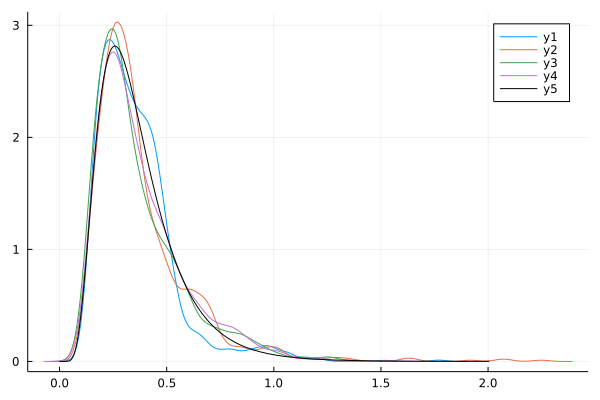

In [166]:
density(chain_h0[:sigma_warmup])
plot!(fit(LogNormal, chain_h0[:sigma_warmup]), color="black")

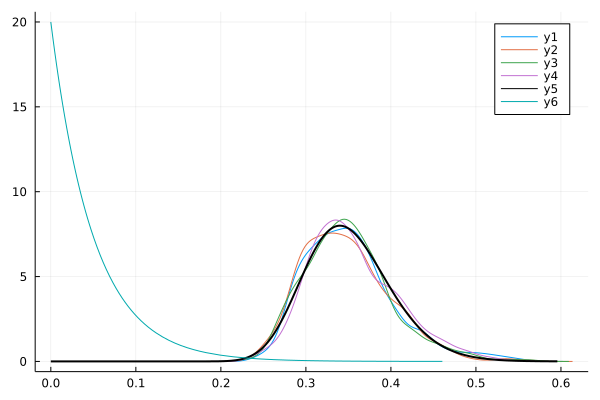

In [167]:
density(chain_h0[:sigma_treatments])
plot!(fit(LogNormal, chain_h0[:sigma_treatments]), linewidth=2.0, color="black")
plot!(Exponential(0.05))

In [168]:
fit(LogNormal, chain_h0[:sigma_treatments])

LogNormal{Float64}(μ=-1.0577669339321332, σ=0.14516218810282502)

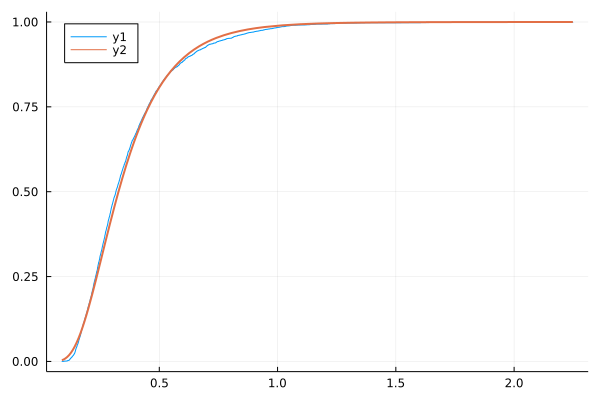

In [169]:
ecdfplot(chain_h0[:sigma_warmup] |> vec)
plot!(x -> cdf(fit(LogNormal, chain_h0[:sigma_warmup]), x), linewidth=2)

We can see that we $\sigma$s started as exponential, but now they look like log-normal distributions. If we want, we can use that posterior as a prior in our next model! 

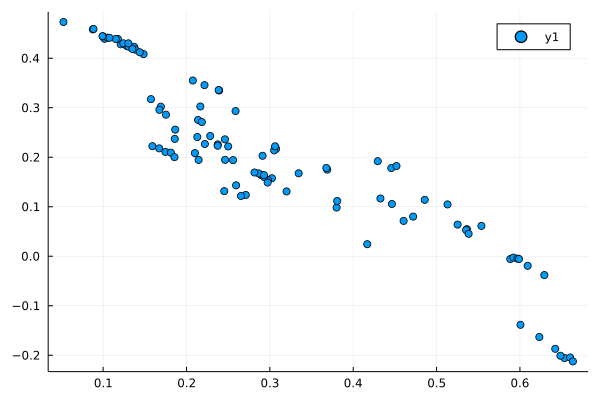

In [170]:
scatter(chain_h0["effect_machine[1]"][1:100], chain_h0["effect_warmup[1]"][1:100])

This high correlation between machine effects and warmup effects is explained by the model: Since the running time is proportional to the *sum* of `effect_machine[1]` and `effect_warmup[1]`, increasing the first requires to decrease the other. This effect ripples to other variables (all `effect_machine` are increased). As a result, `effect_machine[1]` and `effect_machine[2]` are highly correlated. 

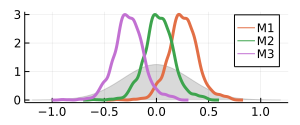

In [171]:
p = plot()


sigma_machines_est = chain_h0["sigma_machines"] |> vec |> mean


plot!(p, Normal(0.0, sigma_machines_est), fill=true, color="black", opacity=0.15, label=missing)


for m in 1:3
    density!(p, chain_h0["effect_machine[$m]"] |> vec,
        label="M$m",
        linewidth=3, size=(300,125))
end


p

In [172]:
savefig(p, "figures/plot_family_distribution_$benchmark.svg")

# Analysis

We can now use the chain of samples to investigate how well the model work, and what it says.

## Posterior predictive accuracy

We try to see if the model can predict accurately the log running times. We need to create a new model, but we use the chain we obtained from the training set.

In [173]:
# Same model, but we pass "missing" as data, so the model tries to guess it.
model_pred_h0 = treatment_model_no_context(length(machines),
                                           length(treatments),
                                           test[!, :machine_ids], 
                                           test[!, :warmup_ids],
                                           test[!, :treatment_ids],
                                           repeat([missing], nrow(test)))

DynamicPPL.Model{typeof(treatment_model_no_context), (:nmachines, :ntreatments, :machine_idxs, :warmup_idxs, :treatment_idxs, :running_time_obs_std, Symbol("##arg#289")), (Symbol("##arg#289"),), (), Tuple{Int64, Int64, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Missing}, DataType}, Tuple{DataType}, DynamicPPL.DefaultContext}(treatment_model_no_context, (nmachines = 3, ntreatments = 21, machine_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], warmup_idxs = Union{Nothing, Int64}[1, 2, 1, 2, 1, 2, 1, 2, 1, 2  …  1, 2, 1, 2, 1, 2, 1, 2, 1, 2], treatment_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  21, 21, 21, 21, 21, 21, 21, 21, 21, 21], running_time_obs_std = [missing, missing, missing, missing, missing, missing, missing, missing, missing, missing  …  missing, missing, missing, missing, missing, missing, missing, missing, missing, missing], ##arg#289 = Float64), (##arg#289

In [174]:
predictions_h0 = predict(model_pred_h0, chain_h0) |> mean |> x -> x.nt.mean

1260-element Vector{Float64}:
  0.37299166815402585
 -0.08673135757101431
  0.37253008760370937
 -0.08426930519850058
  0.3743858209277663
 -0.08678019863944668
  0.3732164782996765
 -0.08511383887108095
  0.3731419523812291
 -0.08559421160469519
  0.37323393231456575
 -0.0831586859408921
  0.3727229797743007
  ⋮
 -0.06673499552364826
 -0.5251241539064958
 -0.06724962564847732
 -0.5239981139299963
 -0.06526892389116022
 -0.5236718894788125
 -0.0659549367857679
 -0.5251844874951658
 -0.06667541524556947
 -0.5254924972735773
 -0.06673155132239902
 -0.5251154518688981

In [175]:
using Statistics

function r2bayes(data, predictions)
    total_sum_sq = (data .- mean(data)).^2 |> sum

    reg_sum_sq = (data .- predictions).^2 |> sum

    return 1 - reg_sum_sq / total_sum_sq
end

r2bayes (generic function with 1 method)

In [176]:
r2bayes(test[!, :centered_log_running_time],
        predictions_h0)

0.9851415588922854

In [177]:
# Let's plot the Bayesian R2 as described in (Gelman 2021)
generated_h0 = generated_quantities(model_pred_h0, chain_h0);

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

Excessive output truncated after 525048 bytes.┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian

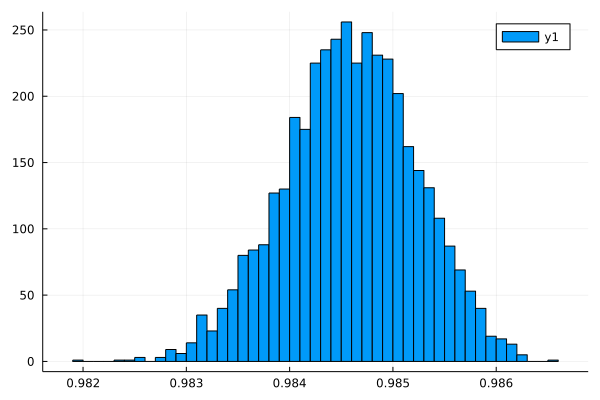

In [178]:
r2_h0 = map(x -> x.r2, generated_h0) |> vec
histogram(r2_h0)

# Plotting effects

In [179]:
function chain_h0_to_df(chain, treatments)
    records = []
    
    baseline = indexin(["original"], treatments)[1]
    
    baseline_samples = vec(chain["effect_treatment[$baseline]"])
    
    records = []
    
    for t_i in 1:length(treatments)
        t = treatments[t_i]

        if t_i == baseline
            continue
        end
        
        samples = vec(chain["effect_treatment[$t_i]"]) .- baseline_samples |> s -> exp.(s)
        
        record = (treatment=t,
            effect_med=(quantile(samples, 0.5)), 
            effect_50_min=(quantile(samples, 0.25)),
            effect_50_max=(quantile(samples, 0.75)),
            effect_95_min=(quantile(samples, 0.025)),
            effect_95_max=(quantile(samples, 0.975)))
        
        append!(records, [record])
    end

    return DataFrame(records)
end

chain_h0_to_df (generic function with 1 method)

In [180]:
df_h0 = chain_h0_to_df(chain_h0, treatments)

,treatment,effect_med,effect_50_min,effect_50_max,effect_95_min,effect_95_max
,String31,Float64,Float64,Float64,Float64,Float64
1,6->hashmap,0.998658,0.991528,1.00637,0.977265,1.02096
2,8->hashmap,0.999606,0.992687,1.00692,0.979226,1.02113
3,9->linkedlist,1.0003,0.992953,1.00764,0.978193,1.02251
4,9->hasharraylist,1.05798,1.05001,1.06567,1.03526,1.08059
5,8->arraymap,0.9984,0.990771,1.00567,0.977371,1.02018
6,7->linkedlist,0.999218,0.991492,1.00646,0.977719,1.02017
7,7->hasharraylist,1.0597,1.05245,1.06762,1.03744,1.08257
8,6->arraymap,1.00066,0.993118,1.00876,0.979225,1.02289
9,5->linkedlist,0.998411,0.99084,1.00597,0.977324,1.02068


In [181]:
using VegaLite

In [182]:
treatment_family_low = chain_h0["sigma_treatments"] * -1 |> vec |> v -> quantile(v, [0.25, 0.5, 0.75]) |> v -> map(exp, v)
treatment_family_high = chain_h0["sigma_treatments"] |> vec |> v -> quantile(v, [0.75, 0.5, 0.25]) |> v -> map(exp, v)

3-element Vector{Float64}:
 1.4633977870303754
 1.412223589746425
 1.3677903943669367

In [194]:
df_filtered = filter(r -> !(r[:effect_50_min] < 1.0 && r[:effect_50_max] > 1.0), df_h0)

,treatment,effect_med,effect_50_min,effect_50_max,effect_95_min,effect_95_max
,String31,Float64,Float64,Float64,Float64,Float64
1,9->hasharraylist,1.05798,1.05001,1.06567,1.03526,1.08059
2,7->hasharraylist,1.0597,1.05245,1.06762,1.03744,1.08257
3,5->hasharraylist,1.07336,1.06558,1.08115,1.05058,1.0962
4,4->hasharraylist,1.05215,1.04433,1.0596,1.02986,1.07444
5,3->hasharraylist,1.05324,1.04548,1.06113,1.03222,1.07422
6,2->hasharraylist,1.05527,1.04738,1.06296,1.03329,1.07788
7,1->linkedlist,1.04109,1.03314,1.04879,1.01836,1.06331
8,1->hasharraylist,1.0582,1.04998,1.0656,1.03559,1.08047
9,0->linkedlist,5.34836,5.3092,5.38907,5.23195,5.47032


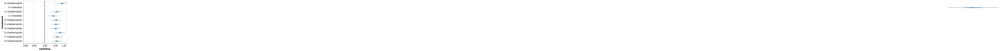

In [195]:
plot_effects_no_interaction = 
    df_filtered |> @vlplot(
            y=:treatment,
            x={scale={domain=(0.9, 1.1), nice=false}},
            width=200,
            layer=[
            {mark={type=:rule, color=:steelblue}, x=:effect_95_min, x2=:effect_95_max},
            {mark={type=:rule, color=:steelblue, strokeWidth=4, opacity=0.5},x=:effect_50_min, x2=:effect_50_max},
            {mark={type=:point}, x={field=:effect_med, scale={zero=false}, title="speedup"}},
            {mark={type=:rule, strokeDash=[4,4]}, x={datum=1.0}, y={value=0.0}, y2={value="height"}},
            ])

In [196]:
save("figures/plot_effects_no_interaction_$benchmark.svg", plot_effects_no_interaction)

In [197]:
mean(chain_h0["sigma_treatments"])

0.35096003051235847

# Model 2.2: Context does matter


This is almost the same model, but the machine and warmup interact with the effect of treatment.

## Machines
We set a prior on the effect of the machine, compared to the mean. The effect is normally distributed with mean 0.0 and $\sigma$ inferred from the data. There is one independent effect for each machine, but the standard deviation is pooled across machines.

$$
\sigma_{machines} \sim \text{Exponential}(0.5)\\
\bar{\alpha}_{m} \sim \text{Normal}(0.0, \sigma_{machine})
$$

## Warmup
We set a similar prior for the effect of warmup: Normally distributed, with a $\sigma$ that is learned from the data. There are two warmup states, so two priors.

$$
\sigma_{warmup} \sim \text{Exponential}(0.5)\\
\bar{\beta}_{startup} \sim \text{Normal}(0.0, \sigma_{warmup})\\
\bar{\beta}_{steady} \sim \text{Normal}(0.0, \sigma_{warmup})
$$

## Interactions
We are not only interested in the effect of the treatment. We're interested in how the effect of treatment *changes* with a different machine, or after warming up. Therefore, we add priors for an interaction term between the machine and the treatment, and another for the interaction between warmup and treatment.

### Treatment + Machine

$$
\sigma_{\text{interations_machine}} \sim \text{Exponential}(0.1)\\
\alpha_{m, t} \sim \text{Normal}(0.0, \sigma_{\text{interations_machine}})\\
$$

### Treatment + Warmup

$$
\sigma_{\text{interations_warmup}} \sim \text{Exponential}(0.1)\\
\beta_{warmup, t} \sim \text{Normal}(0.0, \sigma_{\text{interations_machine}})\\
\beta_{steady, t} \sim \text{Normal}(0.0, \sigma_{\text{interations_machine}})
$$

## Likelihood
We consider the log running time of the program is the sum of these effects plus some gaussian noise.

$$
\log(\text{running_time}_j) \sim \text{Normal}(\mu_j, \sigma)\\
\mu_j = \bar{\alpha}_{M[j]} + \alpha_{M[j], T[j]} + \bar{\beta}_{W[j]} + \beta_{W[j], T[j]}\\
\sigma \sim \text{Exponential(0.1)}
$$

In [198]:
# Model for treatment + interaction for machine + interaction for warmup
# Because I saw that if you split it in two different models, the estimation of MAIN effect of the treatment
# changes a bit!
@model function treatment_model_interactions(
        nmachines, ntreatments,
        machine_idxs, warmup_idxs, treatment_idxs,
        running_time_obs_std, ::Type{T}=Float64) where T

    # We assume the mean running time is zero
    # (I think I have enough data-points to assume
    # there's little uncertainty about that, and centering is enough)

    # Effect of the machine
    sigma_machines ~ Exponential(0.5)
    # This is the posterior for model h0
    # sigma_machines ~ LogNormal(-1, 0.5)
    effect_machine ~ MvNormal(Fill(0.0, nmachines), sigma_machines)

    # Effect of the warmup
    # sigma_warmup ~ Exponential(0.5)
    # This is the posterior for model h0
    sigma_warmup ~ LogNormal(-1, 0.5)
    effect_warmup ~ MvNormal(Fill(0.0, 2), sigma_warmup)
    
    # Interaction warmup + machine
    # sigma_interactions_machine_warmup ~ Exponential(0.4)
    # effect_machine_warmup ~ filldist(Normal(0.0, sigma_interactions_machine_warmup),
    #                                  2, nmachines)

    # Effect of machine + Treatment
    # Posterior for h0
    # sigma_interactions_machine ~ LogNormal(-2.89, 0.22)
    sigma_interactions_machine ~ Exponential(0.05)
    effect_interaction_machine ~ filldist(Normal(0.0, sigma_interactions_machine),
                                          nmachines, ntreatments)

    # Effect of warmup + treatment
    # Posterior for h0
    # sigma_interactions_warmup ~ LogNormal(-2.89, 0.22)
    sigma_interactions_warmup ~ Exponential(0.05)
    effect_interaction_warmup ~ filldist(Normal(0.0, sigma_interactions_warmup),
                                         2, ntreatments)

    sigma ~ Exponential(0.1)

    N = length(running_time_obs_std)
    running_time = Vector{T}(undef, N)
    for i in 1:N
        machine_i = machine_idxs[i]
        warmup_i = warmup_idxs[i]
        treatment_i = treatment_idxs[i]

        effect_jvm = effect_machine[machine_i] + effect_warmup[warmup_i]
        # effect_jvm = effect_machine_warmup[warmup_i, machine_i]
        
        effects_treatment_total = effect_interaction_machine[machine_i, treatment_i] + effect_interaction_warmup[warmup_i, treatment_i]

        # 0.0 is the average time
        running_time[i] = effect_jvm + effects_treatment_total

        running_time_obs_std[i] ~ Normal(running_time[i], sigma)
    end
    
    # Useful for the Bayesian R2
    line_variance = var(running_time)
    residuals_variance = sigma*sigma
    R2 = line_variance / (line_variance + residuals_variance)
    
    return (# effect_machine_1=mean(effect_machine_warmup[:, 1]),
            # effect_machine_2=mean(effect_machine_warmup[:, 2]),
            # effect_machine_3=mean(effect_machine_warmup[:, 3]),
            # effect_startup=mean(effect_machine_warmup[1,:]),
            # effect_steady=mean(effect_machine_warmup[2,:]),
            r2=R2,
            finite_sd_machine=std(effect_machine),
            finite_sd_warmup=std(effect_warmup),
            finite_sd_treatment_machine=std(effect_interaction_machine),
            finite_sd_treatment_warmup=std(effect_interaction_warmup),
            finite_sd_residuals=std(running_time .- running_time_obs_std))
end


treatment_model_interactions (generic function with 3 methods)

In [199]:
model_h1 = treatment_model_interactions(length(machines),
                                        length(treatments),
                                        training[!, :machine_ids],
                                        training[!, :warmup_ids],
                                        training[!, :treatment_ids],
                                        training[!, :centered_log_running_time])

DynamicPPL.Model{typeof(treatment_model_interactions), (:nmachines, :ntreatments, :machine_idxs, :warmup_idxs, :treatment_idxs, :running_time_obs_std, Symbol("##arg#415")), (Symbol("##arg#415"),), (), Tuple{Int64, Int64, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Float64}, DataType}, Tuple{DataType}, DynamicPPL.DefaultContext}(treatment_model_interactions, (nmachines = 3, ntreatments = 21, machine_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], warmup_idxs = Union{Nothing, Int64}[1, 2, 1, 2, 1, 2, 1, 2, 1, 2  …  1, 2, 1, 2, 1, 2, 1, 2, 1, 2], treatment_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  21, 21, 21, 21, 21, 21, 21, 21, 21, 21], running_time_obs_std = [0.40180206088100245, -0.11923424508694502, 0.40446517830048645, -0.11987588771402802, 0.40446517830048645, -0.11795219362928933, 0.39146308308582345, -0.11475423759397341, 0.4002770891786849, -0.1128403614116893 

In [200]:
# These lines made the model go from 10 minutes / chain to 1 minute / chain (!)
# Source: https://discourse.julialang.org/t/multi-level-varying-slopes-with-two-clusters-cross-classification/62036/6?u=neal
# But doesn't really work anymore... 
# using ReverseDiff, Memoization
# Turing.setadbackend(:reversediff)
# Turing.setrdcache(true)

@time(
chain_h1 = sample_model(model_h1)
)

┌ Info: Found initial step size
│   ϵ = 0.025
└ @ Turing.Inference /home/noric/.julia/packages/Turing/Tpj0b/src/inference/hmc.jl:188
Sampling (Chain 1 of 4): 100%|██████████████████████████| Time: 0:29:33


LoadError: InterruptException:

In [201]:
chain_h1

LoadError: UndefVarError: chain_h1 not defined

In [202]:
ess_rhat(chain_h1)

LoadError: UndefVarError: chain_h1 not defined

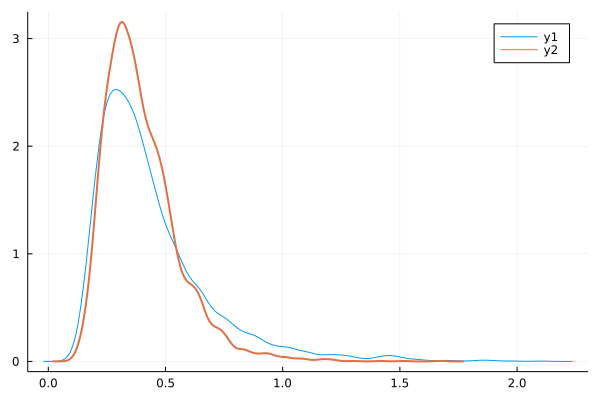

In [121]:
density(chain_h0[:sigma_warmup] |> vec)
density!(chain_h1[:sigma_warmup] |> vec, linewidth=2)

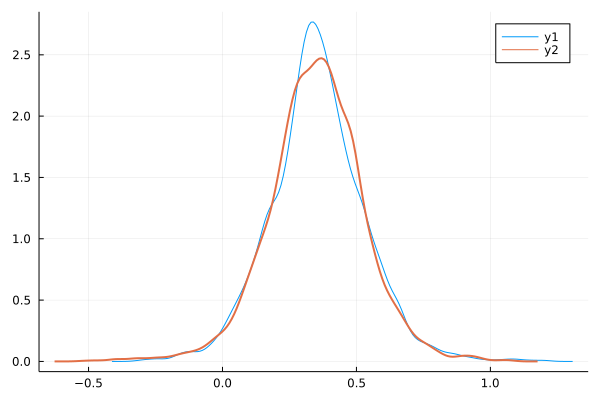

In [122]:
density(chain_h0["effect_machine[1]"] |> vec)
density!(chain_h1["effect_machine[1]"] |> vec, linewidth=2)

In [123]:
ess_rhat(chain_h1) |> DataFrame |> df -> filter(r -> occursin("sigma", string(r[:parameters])), df)

,parameters,ess,rhat,ess_per_sec
,Symbol,Float64,Float64,Float64
1,sigma_machines,2194.85,1.0028,10.7613
2,sigma_warmup,3221.45,1.00059,15.7947
3,sigma_interactions_machine,593.797,1.00868,2.91139
4,sigma_interactions_warmup,2184.85,1.0001,10.7123
5,sigma,4707.07,0.99925,23.0787


## Goodness of fit

In [124]:
model_pred_h1 = treatment_model_interactions(length(machines), length(treatments), 
                                             test[!, :machine_ids], 
                                             test[!, :warmup_ids], 
                                             test[!, :treatment_ids],
                                             repeat([missing], nrow(test)))

DynamicPPL.Model{typeof(treatment_model_interactions), (:nmachines, :ntreatments, :machine_idxs, :warmup_idxs, :treatment_idxs, :running_time_obs_std, Symbol("##arg#524")), (Symbol("##arg#524"),), (), Tuple{Int64, Int64, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Missing}, DataType}, Tuple{DataType}, DynamicPPL.DefaultContext}(treatment_model_interactions, (nmachines = 3, ntreatments = 3, machine_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], warmup_idxs = Union{Nothing, Int64}[1, 2, 1, 2, 1, 2, 1, 2, 1, 2  …  1, 2, 1, 2, 1, 2, 1, 2, 1, 2], treatment_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], running_time_obs_std = [missing, missing, missing, missing, missing, missing, missing, missing, missing, missing  …  missing, missing, missing, missing, missing, missing, missing, missing, missing, missing], ##arg#524 = Float64), (##arg#524 = Floa

In [125]:
predictions_h1 = predict(model_pred_h1, chain_h1) |> mean |> x -> x.nt.mean

180-element Vector{Float64}:
  0.5855469410341894
  0.0966167700678518
  0.5849155645098542
  0.09718166762555557
  0.5849308752588454
  0.0974636649146328
  0.5851597530593036
  0.09708245273487884
  0.5855514765666399
  0.09742014329241828
  0.5851454183204942
  0.09750806085711221
  0.5851226897605608
  ⋮
  0.3998278210917841
 -0.20028731118850335
  0.39988980550374786
 -0.19960883980558697
  0.40022893801411114
 -0.2003116117260399
  0.4006565317832295
 -0.20043262655098323
  0.4003580677876923
 -0.19902632898539746
  0.4000020088282007
 -0.19972746574605663

In [126]:
generated_h1 = generated_quantities(model_pred_h1, chain_h1)

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

Excessive output truncated after 525048 bytes.┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian

1000×4 Matrix{NamedTuple{(:r2, :finite_sd_machine, :finite_sd_warmup, :finite_sd_treatment_machine, :finite_sd_treatment_warmup, :finite_sd_residuals), NTuple{6, Float64}}}:
 (r2 = 0.993834, finite_sd_machine = 0.371591, finite_sd_warmup = 0.35718, finite_sd_treatment_machine = 0.019092, finite_sd_treatment_warmup = 0.0877188, finite_sd_residuals = 0.0316736)     …  (r2 = 0.995313, finite_sd_machine = 0.364107, finite_sd_warmup = 0.386848, finite_sd_treatment_machine = 0.0139322, finite_sd_treatment_warmup = 0.0916742, finite_sd_residuals = 0.0280507)
 (r2 = 0.994392, finite_sd_machine = 0.372041, finite_sd_warmup = 0.384229, finite_sd_treatment_machine = 0.0199201, finite_sd_treatment_warmup = 0.0845457, finite_sd_residuals = 0.0311922)      (r2 = 0.995147, finite_sd_machine = 0.350526, finite_sd_warmup = 0.48095, finite_sd_treatment_machine = 0.0242284, finite_sd_treatment_warmup = 0.0914532, finite_sd_residuals = 0.0282485)
 (r2 = 0.995144, finite_sd_machine = 0.350639, finite_sd_wa

In [127]:
r2_h1 = map(x -> x.r2, generated_h1) |> vec

4000-element Vector{Float64}:
 0.9938344245157987
 0.9943924650212609
 0.9951443466976029
 0.9941882976729872
 0.9948232282155269
 0.9952979371082441
 0.9938271637521708
 0.9935354466575146
 0.9944698194025234
 0.9952904887276298
 0.9945752167219835
 0.9944905139229322
 0.9952310067214296
 ⋮
 0.9955233797092847
 0.9948280162402632
 0.9941635534384016
 0.9940145737311833
 0.9940736979192621
 0.9949244878198716
 0.994278103922974
 0.9944272376150873
 0.9950687762548226
 0.9945578748777611
 0.9948797667111007
 0.9947017616434136

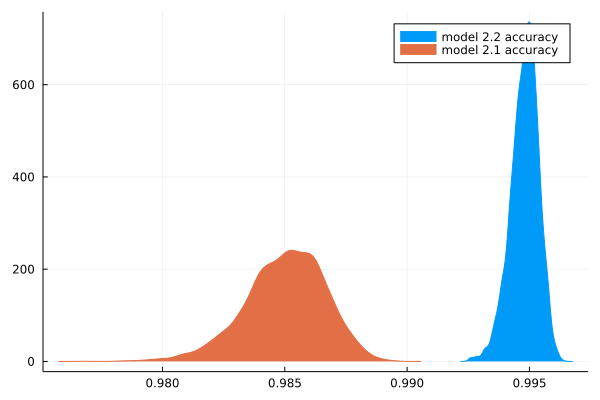

In [128]:
density(r2_h1, label="model 2.2 accuracy", fill=true)
density!(r2_h0, label="model 2.1 accuracy", fill=true)

## Effects of interactions with treatments

In this second model, we look at the interaction of the context with the effects of making changes in the program.

In [129]:
function chain_h1_to_df(treatments, interaction_type, interaction_values, chain)
    records = []
    
    baseline = indexin(["original"], treatments)[1]
    
    for t_i in 1:length(treatments)
        t = treatments[t_i]
        
        if t_i == baseline
            continue
        end

        # Interaction_values can be machines ["m1", "m2", ...]
        # Or "startup", "steady-state"
        for v_i in eachindex(interaction_values)
            v = interaction_values[v_i]
            
            samples_baseline = vec(chain["effect_interaction_$interaction_type[$v_i,$baseline]"])
            
            samples_trtmt = vec(chain["effect_interaction_$interaction_type[$v_i,$t_i]"])
            
            samples = samples_trtmt .- samples_baseline |> s -> exp.(s)

            record = (treatment=t, value=v, effect_type="interaction",
                effect_med=quantile(samples, 0.5),
                effect_50_min=quantile(samples, 0.25),
                effect_50_max=quantile(samples, 0.75),
                effect_95_min=quantile(samples, 0.025),
                effect_95_max=quantile(samples, 0.975))

            append!(records, [record])
        end
    end

    return DataFrame(records)
end

chain_h1_to_df (generic function with 1 method)

In [130]:
df_h1 = chain_h1_to_df(treatments, "warmup", ["startup", "steady-state"], chain_h1)

,treatment,value,effect_type,effect_med,effect_50_min,effect_50_max
,String,String,String,Float64,Float64,Float64
1,t2,startup,interaction,1.02198,1.01066,1.03408
2,t2,steady-state,interaction,0.840961,0.831308,0.851138
3,t1,startup,interaction,1.14237,1.12906,1.15521
4,t1,steady-state,interaction,1.02181,1.00976,1.03301


In [94]:
# Save the data not to have to recompute chains
CSV.write("dataframe-save-$benchmark.csv", df_h1)

"dataframe-save-bloat.csv"

In [131]:
df_h1 = CSV.read("dataframe-save-$benchmark.csv", DataFrame)

,treatment,value,effect_type,effect_med,effect_50_min,effect_50_max
,String3,String15,String15,Float64,Float64,Float64
1,t2,startup,interaction,1.02186,1.01075,1.03446
2,t2,steady-state,interaction,0.841108,0.83216,0.851217
3,t1,startup,interaction,1.1425,1.12921,1.15499
4,t1,steady-state,interaction,1.02218,1.01007,1.0332


In [132]:
using VegaLite

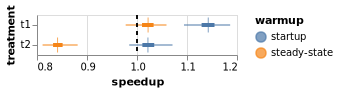

In [133]:
p = df_h1 |>
    @vlplot(
    y=:treatment,
    layer=[
        {mark=:tick, 
         x={field=:effect_med, scale={zero=false}, title="speedup"},
         color={field=:value, title="warmup"}},
        {mark=:rule, x=:effect_95_min, x2=:effect_95_max, color=:value},
        {mark={type=:rule, strokeWidth=4}, x=:effect_50_min, x2=:effect_50_max, color=:value},
        {mark={type=:rule, strokeDash=[4,4]}, x={datum=1.0}, y={value=0.0}, y2={value="height"}}
    ]
  )

In [134]:
VegaLite.save("figures/bayesian-estimate-context-warmup-$benchmark.svg", p)

In [135]:
function effect_machines(treatments, machines, chain)
    baseline = indexin(["original"], treatments)[1]
    
    
    records = []
    
    for m_i in eachindex(machines)
        baseline_samples = chain["effect_interaction_machine[$m_i,$baseline]"] |> vec
        
        for t_i in eachindex(treatments)
            if t_i == baseline
                continue
            end
            
            tmt_samples = chain["effect_interaction_machine[$m_i,$t_i]"] |> vec
            
            diff_samples = tmt_samples .- baseline_samples
            
            for s in diff_samples
                append!(records, [(machine=uppercase(machines[m_i]), treatment=treatments[t_i], effect=s)])
            end
        end
    end
    
    return DataFrame(records)
end

effect_machines (generic function with 1 method)

In [136]:
treatments

3-element Vector{String}:
 "original"
 "t2"
 "t1"

In [137]:
effect_machines_h1 = effect_machines(treatments, machines, chain_h1)
effect_machines_h1[!,:speedup] = exp.(effect_machines_h1[!,:effect])

24000-element Vector{Float64}:
 1.0126885014578062
 1.0182171210428808
 1.0324298734524957
 1.0224365788049232
 0.9803162654157113
 0.9930774115626848
 1.0239423373371488
 1.023158831907299
 1.0134609968213688
 1.0314358133701196
 1.0196559254144255
 1.0035095847106297
 1.03478631743167
 ⋮
 0.9836353838676221
 0.9937019020954572
 0.9883160088104606
 0.9966408783762458
 1.0043513035645617
 1.0039428639094556
 1.0094791228841051
 0.9946710842185661
 0.9956468173038227
 1.0065810499432524
 0.9714672461270032
 1.0164391812010876

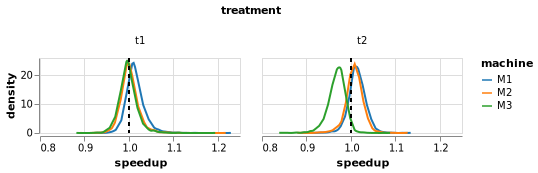

In [138]:
plot_effect_machine_treatment = effect_machines_h1 |>
    # df -> filter(r -> r[:treatment] == "t2", df) |>
    @vlplot(
        facet={column={field=:treatment}},
        spec={
            height=75,
            transform=[{density=:speedup, groupby=[:treatment, :machine]}],
            layer=[{x={field=:value, type=:quantitative, title="speedup"},
                    y={field=:density, type=:quantitative},
                    mark=:line, color={field=:machine, scale={scheme="category10"}}},
                   {mark={type=:rule, strokeDash=[4,4]}, x={datum=1.0, scale={zero=false}}}
                ]}
)

In [139]:
save("figures/plot_posterior_effect_machine_$benchmark.svg", plot_effect_machine_treatment)

In [140]:
df_machines = chain_h1_to_df(treatments, "machine", machines, chain_h1)

,treatment,value,effect_type,effect_med,effect_50_min,effect_50_max,effect_95_min
,String,String,String,Float64,Float64,Float64,Float64
1,t2,m1,interaction,1.01395,1.00299,1.02592,0.975779
2,t2,m2,interaction,1.00822,0.997398,1.01908,0.965787
3,t2,m3,interaction,0.969728,0.957205,0.980606,0.92305
4,t1,m1,interaction,1.01184,1.0017,1.0246,0.978555
5,t1,m2,interaction,1.00013,0.989419,1.01193,0.965755
6,t1,m3,interaction,0.997027,0.986385,1.00854,0.960538


In [141]:
sigma_treatment_machines_high = chain_h1[:sigma_interactions_machine] |> vec |> x -> quantile(x, [0.25, 0.5, 0.75]) |> x -> map(exp, x)
sigma_treatment_machines_low  = chain_h1[:sigma_interactions_machine] |> vec |> x -> x * -1 |> x -> quantile(x, [0.25, 0.5, 0.75]) |> x -> map(exp, x)

3-element Vector{Float64}:
 0.975720232994751
 0.9823717144051509
 0.9871345117456652

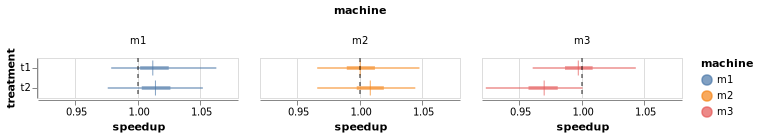

In [142]:
p2 = df_machines |> 
    @vlplot(
    # title="Effect of changes relative to baseline ($benchmark)",
    facet={column={field=:value, title="machine"}},
    spec={
        width=200,
        encoding={y={field=:treatment}, color={field=:value, title="machine"}},
        layer=[
            # {mark={type=:rect, color="grey", opacity=0.1},
            #  x=sigma_treatment_machines_low, x2=sigma_treatment_machines_high},
            {:tick,
             x={field=:effect_med, title="speedup", scale={zero=false}}},
            {mark={type=:rule},
             x=:effect_95_min,
             x2=:effect_95_max},
            {mark={type=:rule, strokeWidth=4, opacity=0.5},
             color=:value,
             x=:effect_50_min,
             x2=:effect_50_max},
            {mark={type=:rule, opacity=0.5, strokeDash=[4,4]}, x={datum=1.0},
                y={value=0.0}, y2={value="height"}, color={value="black"}},
            ]
    },
)

In [143]:
save("figures/plot_effect_machine_$benchmark.svg", p2)

# Model 2.3 Correlated Noise

We'll re-use Model 2.2, except we also have one noise term per treatment.

In [103]:
# We should plot the residuals here.

test[!, :predicted] = predictions_h1
test[!, :residuals] = test[!, :centered_log_running_time] - test[!, :predicted]

180-element Vector{Float64}:
 -0.0373464163194015
 -0.01464983232802855
 -0.019043411288761414
  0.017099765179160065
 -0.011677530617307919
  0.021594875718597403
 -0.007674262517806452
  0.02734288756180238
 -0.04932502546898221
  0.034019030416557655
 -0.014055865039496296
  0.024392289829402503
 -0.04329066719192942
  ⋮
  0.011171933348656626
 -0.03217176685527451
  0.005246949749420193
  0.0443526712969238
  0.006778279390693531
 -0.03398967078062759
  0.013631334249339655
 -0.023077219855894338
  0.0025220244692987226
 -0.007333834011770207
  0.015006981148109555
 -0.021476177450658607

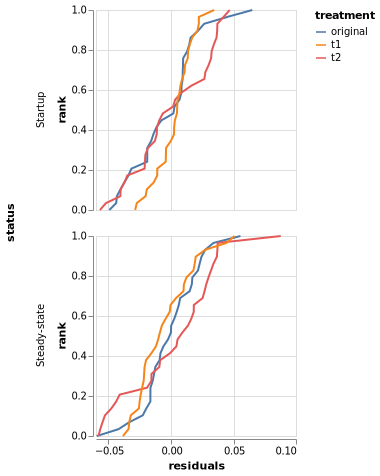

In [104]:
test |> @vlplot(:line, 
    transform=[{sort=[{field=:residuals}],
                groupby=[{field=:treatment}, {field=:status}],
                window=[{op="percent_rank", as="rank"}]}],
    x=:residuals, y={field=:rank, type=:quantitative}, color=:treatment, row=:status)

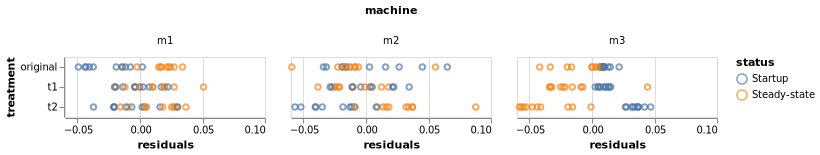

In [105]:
test |> @vlplot(:point,
    x=:residuals,
    y=:treatment,
    color=:status, column=:machine)

In [106]:
@model function treatment_model_correlated_noise(
        nmachines, ntreatments,
        machine_idxs, warmup_idxs, treatment_idxs,
        running_time_obs_std, ::Type{T}=Float64) where T

    # We assume the mean running time is zero
    # (I think I have enough data-points to assume
    # there's little uncertainty about that, and centering is enough)

    # Effect of the machine
    sigma_machines ~ Exponential(0.5)
    # sigma_machines ~ LogNormal(-0.95, 0.44)
    effect_machine ~ MvNormal(Fill(0.0, nmachines), sigma_machines)

    # Effect of the warmup
    sigma_warmup ~ Exponential(0.5)
    # sigma_warmup ~ LogNormal(-1, 0.5)
    effect_warmup ~ MvNormal(Fill(0.0, 2), sigma_warmup)
    
    # Interaction warmup + machine
    # sigma_interactions_machine_warmup ~ Exponential(0.4)
    # effect_machine_warmup ~ filldist(Normal(0.0, sigma_interactions_machine_warmup),
    #                                  2, nmachines)

    # Effect of machine + Treatment
    # We saww that one was useless earlier.
    sigma_interactions_machine ~ Exponential(0.1)
    # Posterior for h0
    # sigma_interactions_machine ~ LogNormal(-2.89, 0.22)
    
    effect_interaction_machine ~ filldist(Normal(0.0, sigma_interactions_machine), nmachines, ntreatments)

    # Effect of warmup + treatment
    sigma_interactions_warmup ~ Exponential(0.05)
    # posterior for H0
    # sigma_interactions_warmup ~ LogNormal(-2.89, 0.22)
    effect_interaction_warmup ~ filldist(Normal(0.0, sigma_interactions_warmup),
                                         2, ntreatments)

    # One noise term per machine and warmup!
    sigma_noise ~ filldist(Exponential(0.1), ntreatments)

    N = length(running_time_obs_std)
    running_time = Vector{T}(undef, N)
    residuals = Vector{T}(undef, N)
    
    for i in 1:N
        machine_i = machine_idxs[i]
        warmup_i = warmup_idxs[i]
        treatment_i = treatment_idxs[i]

        effect_jvm = effect_machine[machine_i] + effect_warmup[warmup_i]
        
        effects_treatment_total = effect_interaction_warmup[warmup_i, treatment_i] + effect_interaction_machine[machine_i, treatment_i]

        # 0.0 is the average time
        running_time[i] = effect_jvm + effects_treatment_total

        running_time_obs_std[i] ~ Normal(running_time[i], sigma_noise[treatment_i])
        
        residuals[i] = running_time_obs_std[i] - running_time[i]
    end
    
    # Useful for the Bayesian R2
    line_variance = var(running_time)
    residuals_variance = var(residuals)
    R2 = line_variance / (line_variance + residuals_variance)
    
    return (#effect_machine_1=mean(effect_machine_warmup[:, 1]),
            #effect_machine_2=mean(effect_machine_warmup[:, 2]),
            #effect_machine_3=mean(effect_machine_warmup[:, 3]),
            #effect_startup=mean(effect_machine_warmup[1,:]),
            #effect_steady=mean(effect_machine_warmup[2,:]),
            r2=R2,
            finite_sd_noises=std(sigma_noise),
            finite_sd_machine=std(effect_machine),
            finite_sd_warmup=std(effect_warmup),
            finite_sd_treatment_machine=std(effect_interaction_machine),
            finite_sd_treatment_warmup=std(effect_interaction_warmup),
            finite_sd_residuals=std(running_time .- running_time_obs_std))
end

treatment_model_correlated_noise (generic function with 3 methods)

In [107]:
model_h2 = treatment_model_correlated_noise(length(machines),
                                        length(treatments),
                                        training[!, :machine_ids],
                                        training[!, :warmup_ids],
                                        training[!, :treatment_ids],
                                        training[!, :centered_log_running_time])

DynamicPPL.Model{typeof(treatment_model_correlated_noise), (:nmachines, :ntreatments, :machine_idxs, :warmup_idxs, :treatment_idxs, :running_time_obs_std, Symbol("##arg#451")), (Symbol("##arg#451"),), (), Tuple{Int64, Int64, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Float64}, DataType}, Tuple{DataType}, DynamicPPL.DefaultContext}(treatment_model_correlated_noise, (nmachines = 3, ntreatments = 3, machine_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], warmup_idxs = Union{Nothing, Int64}[1, 2, 1, 2, 1, 2, 1, 2, 1, 2  …  1, 2, 1, 2, 1, 2, 1, 2, 1, 2], treatment_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], running_time_obs_std = [0.5414480488929234, 0.07800993159913805, 0.5871649649545736, 0.11597504182513418, 0.5756995790962227, 0.11451305326063466, 0.5347430429303195, 0.12397799468793558, 0.5466849092306063, 0.1218017152653399  …  0.417620

In [108]:
@time(
chain_h2 = sample_model(model_h2)
)

┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /home/noric/.julia/packages/AdvancedHMC/iWHPQ/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /home/noric/.julia/packages/AdvancedHMC/iWHPQ/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /home/noric/.julia/packages/AdvancedHMC/iWHPQ/src/hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC /home/noric/.julia/packages/AdvancedHMC/iWHPQ/src/hamiltonian.jl:47
┌ Info: Found initial step size
│   ϵ = 0.00078125
└ @ Turing.Inference /home/noric/.julia/packages/Turing/Tpj0b/src/inf

289.855851 seconds (397.82 M allocations: 369.253 GiB, 10.12% gc time, 5.30% compilation time)


Chains MCMC chain (1000×39×4 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 4
Samples per chain = 1000
Wall duration     = 287.68 seconds
Compute duration  = 286.88 seconds
parameters        = sigma_machines, effect_machine[1], effect_machine[2], effect_machine[3], sigma_warmup, effect_warmup[1], effect_warmup[2], sigma_interactions_machine, effect_interaction_machine[1,1], effect_interaction_machine[2,1], effect_interaction_machine[3,1], effect_interaction_machine[1,2], effect_interaction_machine[2,2], effect_interaction_machine[3,2], effect_interaction_machine[1,3], effect_interaction_machine[2,3], effect_interaction_machine[3,3], sigma_interactions_warmup, effect_interaction_warmup[1,1], effect_interaction_warmup[2,1], effect_interaction_warmup[1,2], effect_interaction_warmup[2,2], effect_interaction_warmup[1,3], effect_interaction_warmup[2,3], sigma_noise[1], sigma_noise[2], sigma_noise[3]
internals         = lp, n_steps, is_accept, acceptance_rate, log_den

In [109]:
ess_rhat(chain_h2)

ESS
                       parameters         ess      rhat   ess_per_sec 
                           Symbol     Float64   Float64       Float64 

                   sigma_machines   2082.4055    1.0035        7.2588
                effect_machine[1]    977.8002    1.0016        3.4084
                effect_machine[2]    992.6669    1.0016        3.4602
                effect_machine[3]    977.3555    1.0015        3.4069
                     sigma_warmup   2670.2293    1.0015        9.3079
                 effect_warmup[1]   1016.7009    1.0020        3.5440
                 effect_warmup[2]   1023.8524    1.0018        3.5689
       sigma_interactions_machine    467.6577    1.0078        1.6302
  effect_interaction_machine[1,1]   2841.4624    1.0002        9.9047
  effect_interaction_machine[2,1]   2876.5710    1.0003       10.0271
  effect_interaction_machine[3,1]   2604.8370    1.0009        9.0799
  effect_interaction_machine[1,2]   2725.4024    1.0026        9.5002
  effect_inte

In [110]:
indexin(["original"], treatments)

1-element Vector{Union{Nothing, Int64}}:
 1

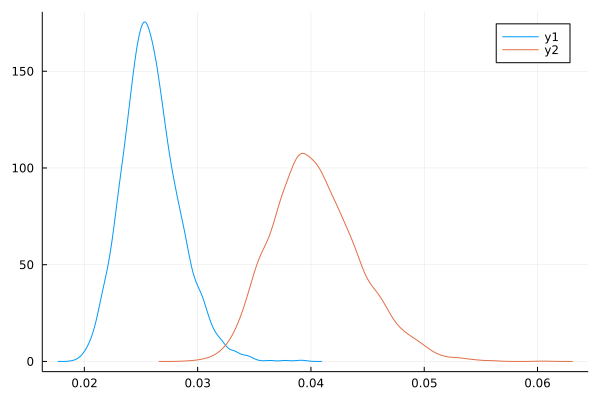

In [111]:
density(chain_h2["sigma_noise[1]"] |> vec)
density!(chain_h2["sigma_noise[2]"] |> vec)

## Goodness of fit

In [112]:
model_h2_pred = treatment_model_correlated_noise(length(machines),
                                        length(treatments),
                                        test[!, :machine_ids],
                                        test[!, :warmup_ids],
                                        test[!, :treatment_ids],
                                        test[!, :centered_log_running_time])

DynamicPPL.Model{typeof(treatment_model_correlated_noise), (:nmachines, :ntreatments, :machine_idxs, :warmup_idxs, :treatment_idxs, :running_time_obs_std, Symbol("##arg#451")), (Symbol("##arg#451"),), (), Tuple{Int64, Int64, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Union{Nothing, Int64}}, Vector{Float64}, DataType}, Tuple{DataType}, DynamicPPL.DefaultContext}(treatment_model_correlated_noise, (nmachines = 3, ntreatments = 3, machine_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], warmup_idxs = Union{Nothing, Int64}[1, 2, 1, 2, 1, 2, 1, 2, 1, 2  …  1, 2, 1, 2, 1, 2, 1, 2, 1, 2], treatment_idxs = Union{Nothing, Int64}[1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  3, 3, 3, 3, 3, 3, 3, 3, 3, 3], running_time_obs_std = [0.548582443006798, 0.08255195303363916, 0.5668971131791958, 0.11451305326063466, 0.5738528565030574, 0.11889262230465647, 0.5784632842178405, 0.12397799468793558, 0.535703657797657, 0.13119824266142288  …  0.4045697

In [113]:
generated_h2 = generated_quantities(model_h2_pred, chain_h2)

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

Excessive output truncated after 525048 bytes.┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian

1000×4 Matrix{NamedTuple{(:r2, :finite_sd_noises, :finite_sd_machine, :finite_sd_warmup, :finite_sd_treatment_machine, :finite_sd_treatment_warmup, :finite_sd_residuals), NTuple{7, Float64}}}:
 (r2 = 0.99576, finite_sd_noises = 0.00727798, finite_sd_machine = 0.370375, finite_sd_warmup = 0.398687, finite_sd_treatment_machine = 0.0202139, finite_sd_treatment_warmup = 0.076265, finite_sd_residuals = 0.0275246)    …  (r2 = 0.995561, finite_sd_noises = 0.0116658, finite_sd_machine = 0.375618, finite_sd_warmup = 0.455429, finite_sd_treatment_machine = 0.0268179, finite_sd_treatment_warmup = 0.108757, finite_sd_residuals = 0.0284862)
 (r2 = 0.995939, finite_sd_noises = 0.0104437, finite_sd_machine = 0.362797, finite_sd_warmup = 0.451213, finite_sd_treatment_machine = 0.0166847, finite_sd_treatment_warmup = 0.0965908, finite_sd_residuals = 0.0269393)      (r2 = 0.995768, finite_sd_noises = 0.00555147, finite_sd_machine = 0.33888, finite_sd_warmup = 0.389313, finite_sd_treatment_machine = 0.03

In [114]:
r2_h2 = map(x -> x.r2, generated_h2) |> vec

4000-element Vector{Float64}:
 0.9957604619570353
 0.995939106427491
 0.995991993011188
 0.9960083226224598
 0.9957200826148216
 0.9955168083426948
 0.9954073651613369
 0.995742923470112
 0.9957426027030531
 0.9957815050690528
 0.9960470892476815
 0.9957267969154717
 0.9960690043202586
 ⋮
 0.9959431965681187
 0.995547183535887
 0.9958407353706534
 0.9958782748580332
 0.9959633310378906
 0.9959700054052149
 0.9960949954619366
 0.9960919125565123
 0.9959376243513506
 0.9958976833926052
 0.9956738210727055
 0.9959155287220556

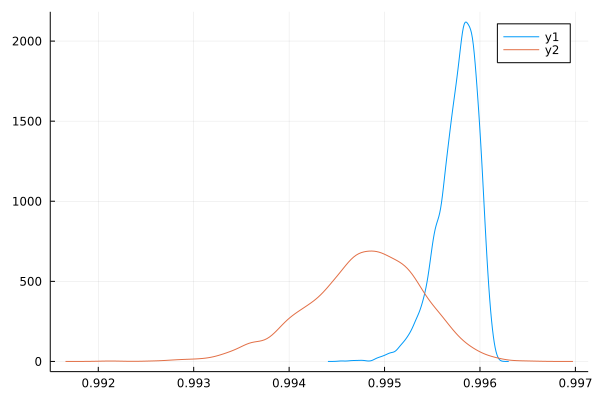

In [115]:
density(r2_h2)
density!(r2_h1)

In [116]:
function noise_chain_to_df(chain, treatments)
    baseline = indexin(["original"], treatments)[1]
    
    baseline_samples = chain["sigma_noise[$baseline]"] |> vec
    
    records = []
    
    for t_i in eachindex(treatments)
        t = treatments[t_i]
        
        if t == "original"
            continue
        end
        
        tmt_samples = chain["sigma_noise[$t_i]"] |> vec
        diff = tmt_samples .- baseline_samples
        for d in diff
            append!(records, [(treatment=t, difference=d)])
        end

    end
    
    return DataFrame(records)
end


noise_chain_to_df (generic function with 1 method)

In [117]:
noise_df = noise_chain_to_df(chain_h2, treatments)

,treatment,difference
,String,Float64
1,t2,0.0107641
2,t2,0.0181518
3,t2,0.0107791
4,t2,0.013733
5,t2,0.0149123
6,t2,0.0145887
7,t2,0.0219574
8,t2,0.0140546
9,t2,0.0123101


In [118]:
combine(noise_df, :difference => mean)

,difference_mean
,Float64
1,0.00648667


In [144]:
function interval_50_min(x)
    return quantile(x, 0.25)
end
function interval_50_max(x)
    return quantile(x, 0.75)
end
function interval_95_min(x)
    return quantile(x, 0.025)
end
function interval_95_max(x)
    return quantile(x, 0.975)
end

interval_95_max (generic function with 1 method)

In [145]:
noise_df = groupby(noise_df, :treatment) |> 
    df -> combine(df, 
        :difference .=> [median,
                     interval_95_min,
                     interval_95_max])

LoadError: UndefVarError: noise_df not defined

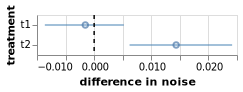

In [121]:
plot_difference_sigmas = noise_df |> 
    @vlplot(x={field=:difference_median, title="difference in noise"},
            y={field=:treatment},
            layer=[
                {mark={type=:rule, color="steelblue"},
                 x=:difference_interval_95_min,
                 x2=:difference_interval_95_max},
                {mark=:point, x={field=:difference_median}},
                {mark={type=:rule, strokeDash=[4,4]}, x={datum=0.0}, y={value=0.0}, y2={value="height"}}
        ])

In [122]:
save("figures/plot_difference_sigmas_$benchmark.svg", plot_difference_sigmas)

We can see that the fastest treatment makes the benchmark a little more unstable on average. It's small but it's also *definitely not zero*. 

A "difference of sigmas" is hard to interpret, but we can suggest to use posterior predictive simulation in that case, as it now includes the noise.

## Posterior predictive simulation with model 2


In [146]:
treatments

3-element Vector{String}:
 "original"
 "t2"
 "t1"

In [147]:
treatments

3-element Vector{String}:
 "original"
 "t2"
 "t1"

In [148]:
function counterfactual_difference(warmup_state, machines, treatments, chain)
    baseline = indexin(["original"], treatments)[1]
    
    machine_idx = 1:length(machines)
    
    model_h2_original = treatment_model_correlated_noise(length(machines), length(treatments), 
                                                     [m for m in machine_idx],
                                                     [warmup_state for _ in machine_idx], 
                                                     [baseline for _ in machine_idx],
                                                     repeat([missing], length(machine_idx)))
    
    predictions_original = predict(model_h2_original, chain)
    
    alternative = indexin(["t3"], treatments)[1]
    
    model_h2_fast = treatment_model_correlated_noise(length(machines), length(treatments), 
                                                     [m for m in machine_idx],
                                                     [warmup_state for _ in machine_idx], 
                                                     [alternative for _ in machine_idx],
                                                     repeat([missing], length(machine_idx)))

    predictions_fast = predict(model_h2_fast, chain)
    
    difference = predictions_fast.value .- predictions_original.value |> vec |> v -> map(exp, v)
    
    return difference
end

counterfactual_difference (generic function with 1 method)

In [126]:
startup_diff = counterfactual_difference(1, machines, treatments, chain_h2)
steady_diff = counterfactual_difference(2, machines, treatments, chain_h2)

LoadError: ArgumentError: invalid index: nothing of type Nothing

In [127]:
plot_difference = density(startup_diff, label="Startup", linewidth=2, size=(450,250), legend=:outertopright)
density!(plot_difference, steady_diff, label="Steady state", linewidth=2)
vline!(plot_difference, [1.0], color="black", linestyle=:dot, label="no change", linewidth=2)

LoadError: UndefVarError: startup_diff not defined

In [128]:
save("figures/plot_difference_original_fastest_$benchmark.svg", plot_difference)

LoadError: UndefVarError: plot_difference not defined

# Plotting of effects

We plot the main effects, as well as the interactions.

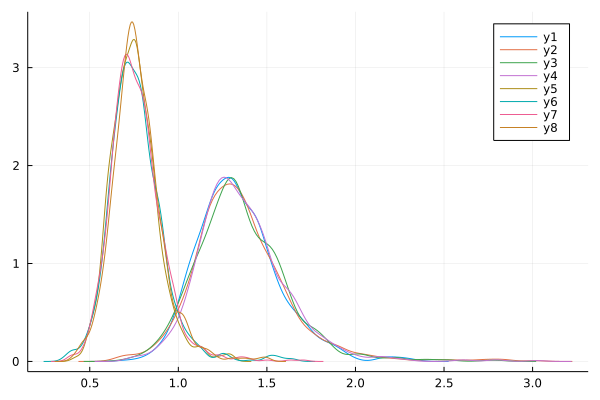

In [149]:
density(map(exp, chain_h1["effect_warmup[1]"]))
density!(map(exp, chain_h1["effect_warmup[2]"]))

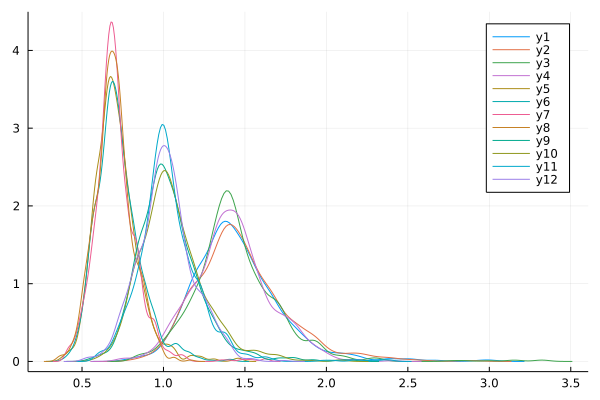

In [150]:
density(map(exp, chain_h0["effect_machine[1]"]))
density!(map(exp, chain_h0["effect_machine[2]"]))
density!(map(exp, chain_h0["effect_machine[3]"]))

# Posteriors

We want to look at the posteriors of the sigmas for treatments, I'm wondering if they're large enough

In [151]:
function plot_prior_posterior(title, prior, posterior)
    p = density(posterior, plot_title=title, linecolor="black", linewidth=3, label="Posterior")

    plot!(p, prior, linecolor="gray", label="Prior")

    return p
end

plot_prior_posterior (generic function with 1 method)

In [152]:
rename_dict = Dict("sigma_machines" => "σ machine",
                   "sigma_treatments" => "σ treatment",
                   "sigma_warmup" => "σ warmup",
                   "sigma" => "σ residuals")

Dict{String, String} with 4 entries:
  "sigma"            => "σ residuals"
  "sigma_machines"   => "σ machine"
  "sigma_warmup"     => "σ warmup"
  "sigma_treatments" => "σ treatment"

In [153]:
df_sigmas_h0 = DataFrame(chain_h0) |> 
    df -> rename(df, rename_dict) |>
    DataFrames.stack |>
    df -> filter(r -> occursin("σ", r[:variable]), df) |>
    df -> groupby(df, :variable) |>
    df -> combine(df, :value .=> [median, interval_50_min, interval_50_max, interval_95_min, interval_95_max])

,variable,value_median,value_interval_50_min,value_interval_50_max,value_interval_95_min
,String,Float64,Float64,Float64,Float64
1,σ machine,0.369039,0.28262,0.492631,0.183335
2,σ warmup,0.377936,0.27562,0.530747,0.169982
3,σ treatment,0.0917181,0.0679969,0.130176,0.0421559
4,σ residuals,0.0517976,0.0499443,0.0537363,0.0468338


In [154]:
df_sigmas_h1 = DataFrame(chain_h1) |> 
    df -> rename(df, :sigma_machines => "σ machine",
        :sigma_warmup => "σ warmup",
        :sigma_interactions_machine => "σ interactions machine",
        :sigma_interactions_warmup => "σ interactions warmup",
        :sigma => "σ residuals") |>
    DataFrames.stack |>
    df -> filter(r -> occursin("σ", r[:variable]), df) |>
    df -> groupby(df, :variable) |>
    df -> combine(df, :value .=> [median,interval_50_min,interval_50_max,interval_95_min,interval_95_max])

,variable,value_median,value_interval_50_min,value_interval_50_max
,String,Float64,Float64,Float64
1,σ machine,0.382953,0.285303,0.531416
2,σ warmup,0.366378,0.286762,0.476706
3,σ interactions machine,0.0177855,0.012949,0.0245794
4,σ interactions warmup,0.0872553,0.071504,0.10879
5,σ residuals,0.0304891,0.0294498,0.0316366


In [155]:
function plot_sigmas(df_sigmas)
    return df_sigmas |> 
        @vlplot(layer=[
        {mark=:tick, x={field=:value_median, title="variance"},
         y={:variable, sort=:value_median}},
        {mark={type=:rule, strokeWidth=4, color="steelblue", opacity=0.5}, 
         x=:value_interval_50_min, x2=:value_interval_50_max,
         y={:variable, sort=:value_median}},
        {mark={type=:rule, color="steelblue"}, x=:value_interval_95_min, x2=:value_interval_95_max,
         y={:variable, sort=:value_median}},
        ])
end

plot_sigmas (generic function with 1 method)

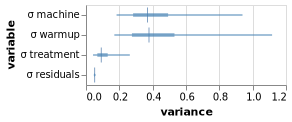

In [156]:
sigmas_h0_plot = plot_sigmas(df_sigmas_h0)

In [157]:
save("figures/plot-sigmas-no-interaction-$benchmark.svg", sigmas_h0_plot)

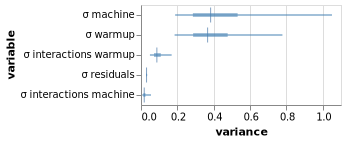

In [158]:
sigmas_h1_plot = plot_sigmas(sort(df_sigmas_h1, :value_median, rev=true))

In [159]:
save("figures/plot-sigmas-interactions-$benchmark.svg", sigmas_h1_plot)

In [160]:
gen_h0 = generated_quantities(model_h0, chain_h0);

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

Excessive output truncated after 525048 bytes.┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian

In [161]:
df_gen_h0 = gen_h0 |> vec |> DataFrame

,finite_sd_machine,finite_sd_warmup,finite_sd_treatments,finite_sd_residuals
,Float64,Float64,Float64,Float64
1,0.357799,0.419198,0.0827239,0.0521254
2,0.361272,0.431783,0.0750401,0.0525778
3,0.358632,0.429844,0.0712629,0.0526876
4,0.359224,0.41678,0.0721967,0.0519474
5,0.360473,0.421514,0.0845171,0.0517361
6,0.356461,0.422016,0.0829953,0.0516807
7,0.359056,0.427266,0.0769771,0.0519848
8,0.357151,0.423753,0.0805216,0.0516436
9,0.354645,0.427406,0.0782991,0.0523398


In [162]:
quantile(df_gen_h0[!,:finite_sd_warmup], [0.025, 0.975])

2-element Vector{Float64}:
 0.40678263781953933
 0.4279518145511281

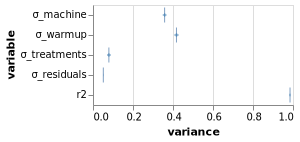

In [163]:
df_gen_h0 |> df -> rename(df, :finite_sd_machine => :σ_machine,
                 :finite_sd_warmup => :σ_warmup,
                 :finite_sd_treatments => :σ_treatments,
                 :finite_sd_residuals => :σ_residuals) |> DataFrames.stack |>
    df -> groupby(df, :variable) |>
    df -> combine(df, :value .=> [median, interval_50_min, interval_50_max, interval_95_min, interval_95_max]) |>
    plot_sigmas

In [164]:
df_gen_h1 = generated_quantities(model_h1, chain_h1) |> vec |> DataFrame

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_ham

Excessive output truncated after 525048 bytes.┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian_energy", "hamiltonian_energy_error", "max_hamiltonian_energy_error", "tree_depth", "numerical_error", "step_size", "nom_step_size"]
└ @ DynamicPPL /home/noric/.julia/packages/DynamicPPL/1qg3U/src/varinfo.jl:1374
┌ Warning: the following keys were not found in `vi`, and thus `kernel!` was not applied to these: ["lp", "n_steps", "is_accept", "acceptance_rate", "log_density", "hamiltonian

,r2,finite_sd_machine,finite_sd_warmup,finite_sd_treatment_machine,finite_sd_treatment_warmup
,Float64,Float64,Float64,Float64,Float64
1,0.993834,0.371591,0.35718,0.019092,0.0877188
2,0.994392,0.372041,0.384229,0.0199201,0.0845457
3,0.995144,0.350639,0.413351,0.0278823,0.0854428
4,0.994188,0.368742,0.379445,0.0203821,0.0835039
5,0.994823,0.366627,0.44979,0.0241131,0.072736
6,0.995298,0.355496,0.402262,0.0225739,0.0702506
7,0.993827,0.36405,0.416081,0.0126032,0.0872156
8,0.993535,0.374672,0.425017,0.0138791,0.0852245
9,0.99447,0.366395,0.378409,0.0184345,0.0911922


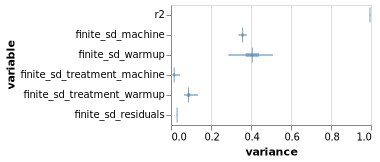

In [165]:
df_gen_h1 |> DataFrames.stack |>
    df -> groupby(df, :variable) |>
    df -> combine(df, :value .=> [median, 
        interval_50_min, interval_50_max, 
        interval_95_min, interval_95_max]) |>
    plot_sigmas

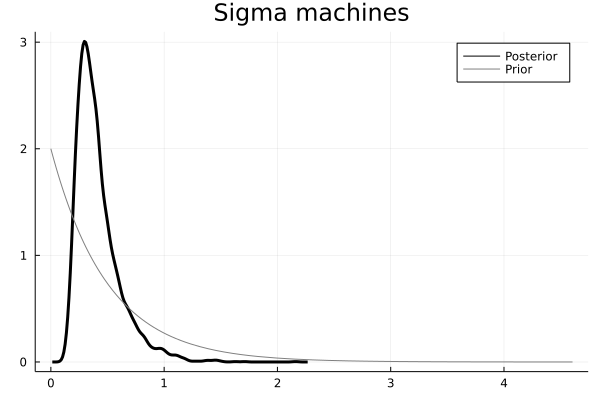

In [166]:
plot_prior_posterior("Sigma machines",
    Exponential(0.5),
    chain_h0[:sigma_machines] |> vec)

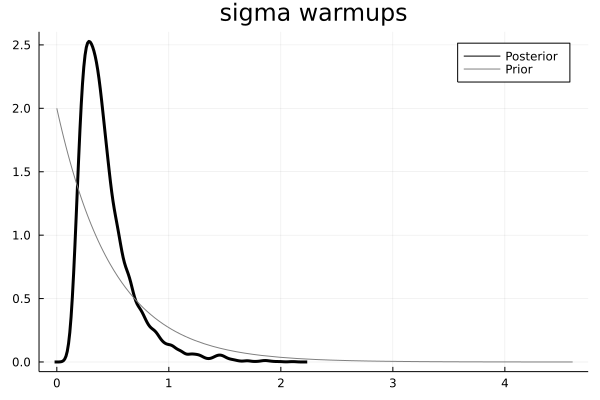

In [167]:
plot_sigma_wmups = plot_prior_posterior("sigma warmups",
    Exponential(0.5),
    chain_h0[:sigma_warmup] |> vec)

For `lusearch` the posterior seems to be bimodal, which means that the model is unsure how much space there is between the effect of startup and the effect of steady state. This is for a good reason: in the case of `lusearch`, the warmup effect depends on which machine you use. 

In [168]:
save("figures/plot_sigma_warmups_$benchmark.pdf", plot_sigma_wmups)

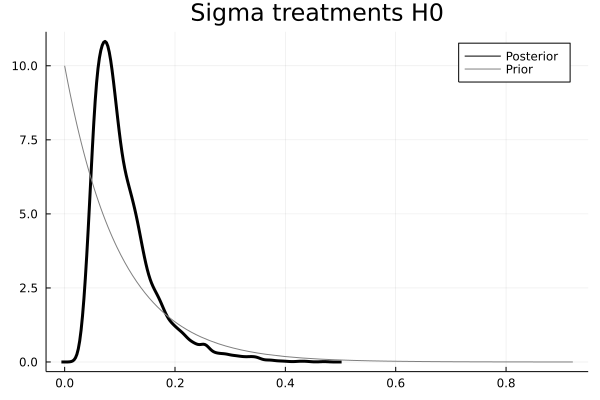

In [169]:
plot_prior_posterior("Sigma treatments H0", 
    Exponential(0.1),
    chain_h0[:sigma_treatments] |> vec)

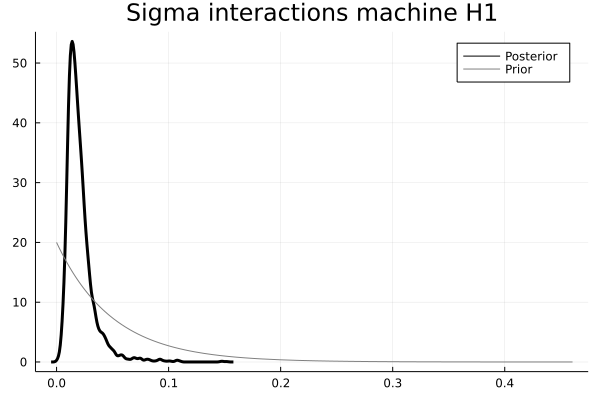

In [170]:
plot_prior_posterior("Sigma interactions machine H1",
    Exponential(0.05),
    chain_h1[:sigma_interactions_machine] |> vec
    )

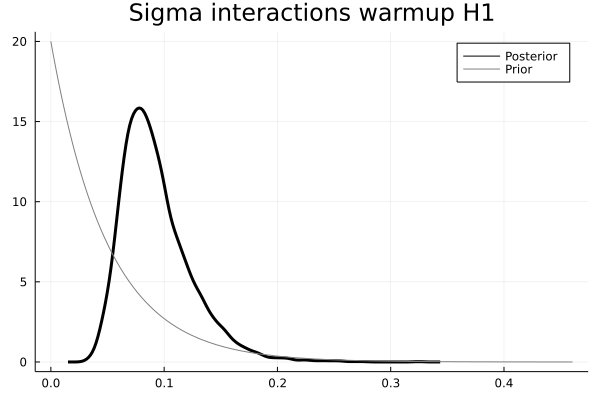

In [171]:
plot_prior_posterior("Sigma interactions warmup H1",
    Exponential(0.05),
    chain_h1[:sigma_interactions_warmup] |> vec)

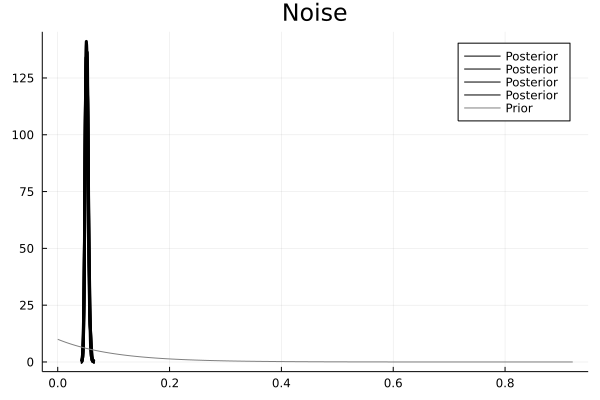

In [172]:
plot_prior_posterior("Noise",
    Exponential(0.1),
    chain_h0[:sigma])